In [ ]:
import os
from google.colab import drive
import shutil
drive.mount('/content/drive')
folder_path = '/content/drive/My Drive/ECG-signals'
files = os.listdir(folder_path)
local_path = '/content/your_local_directory'
os.makedirs(local_path, exist_ok=True)
for file_name in files:
    full_file_name = os.path.join(folder_path, file_name)
    if os.path.isfile(full_file_name):
        shutil.copy(full_file_name, local_path)
copied_files = os.listdir(local_path)


Mounted at /content/drive


In [ ]:
!pip -q install neurokit2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.2/689.2 kB 6.9 MB/s eta 0:00:00


In [ ]:
!pip -q install ts2vg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 9.7 MB/s eta 0:00:00


**#219_____________________________**

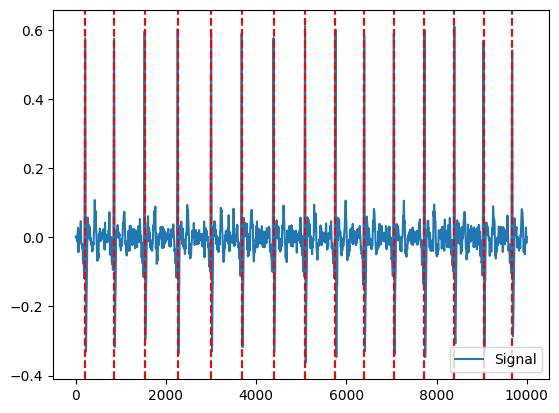

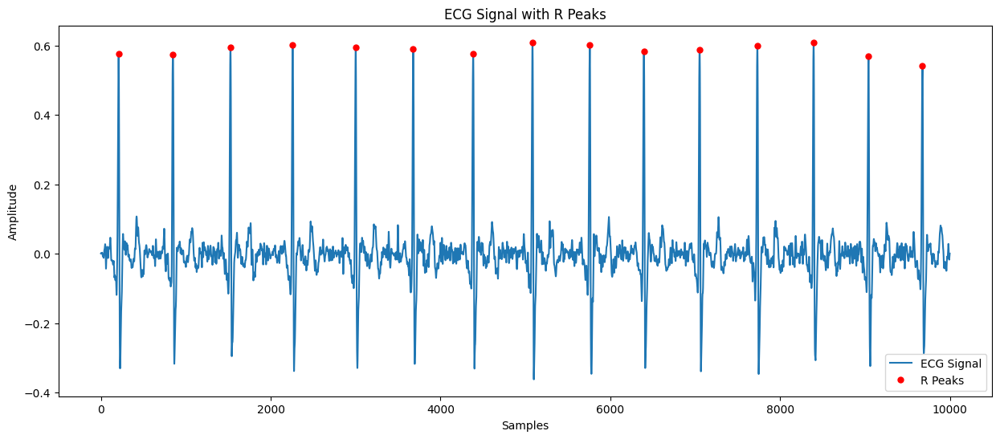

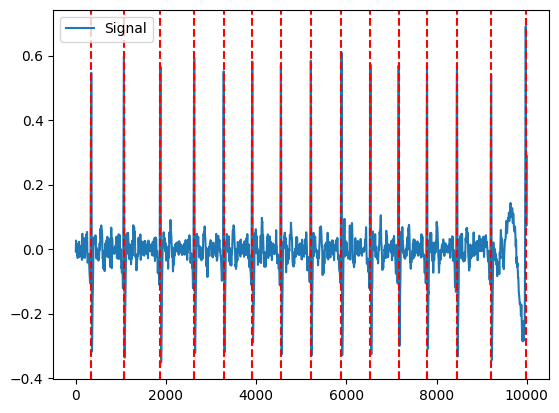

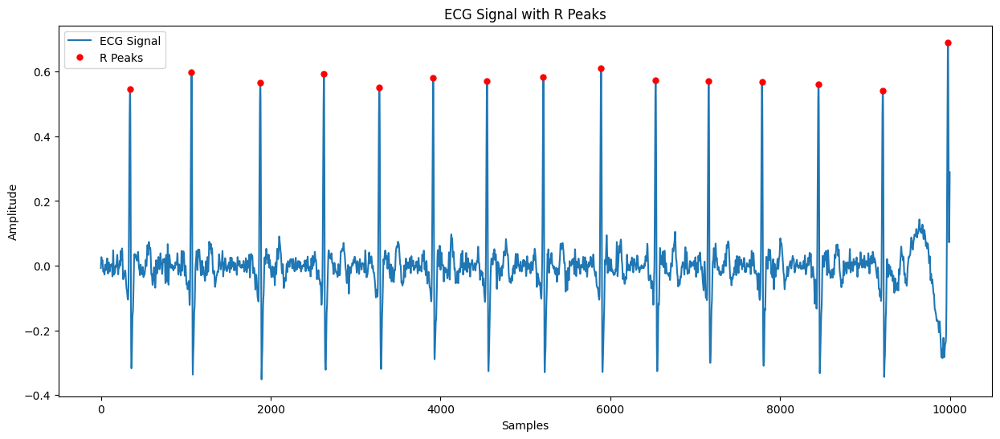

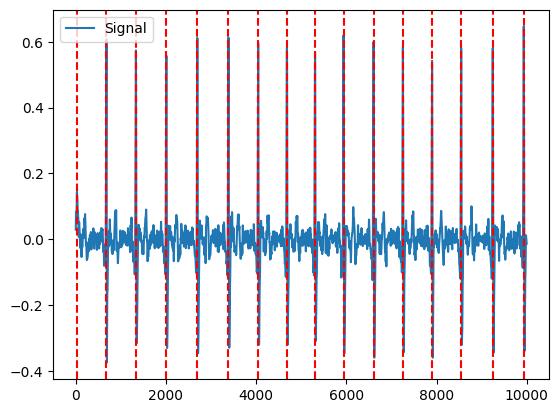

...

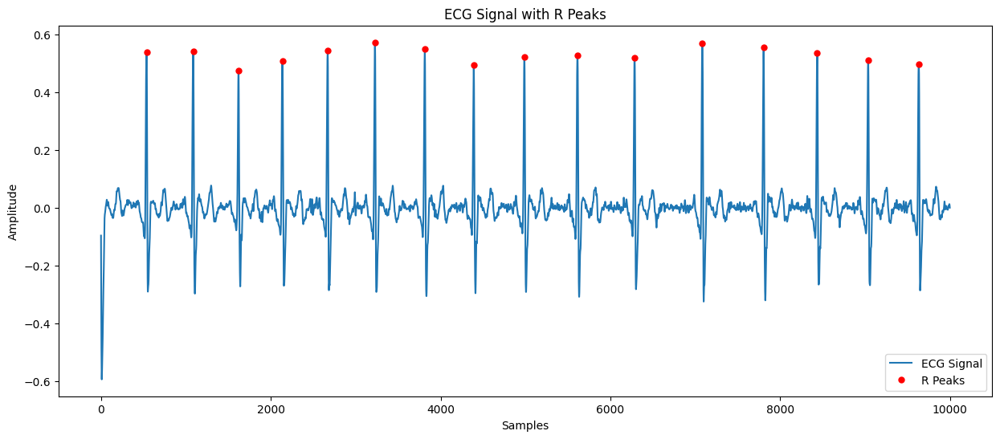

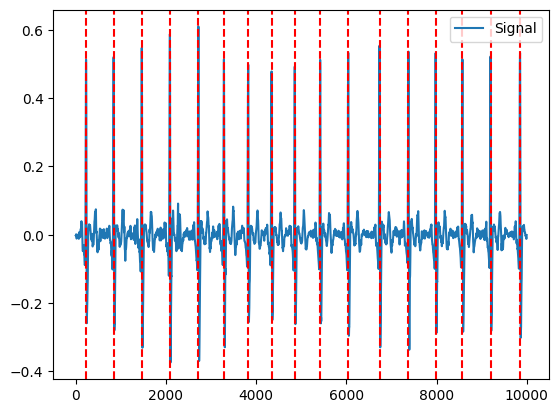

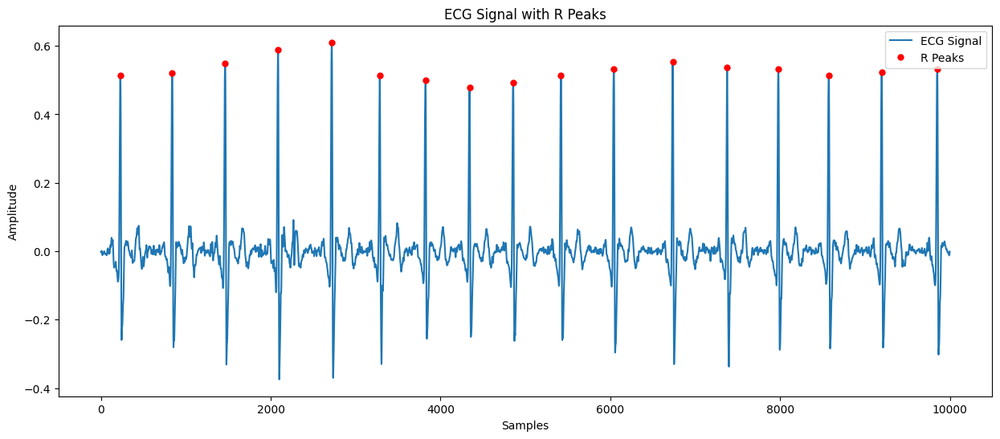

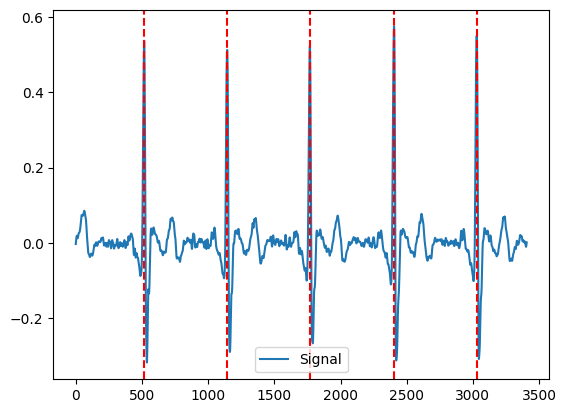

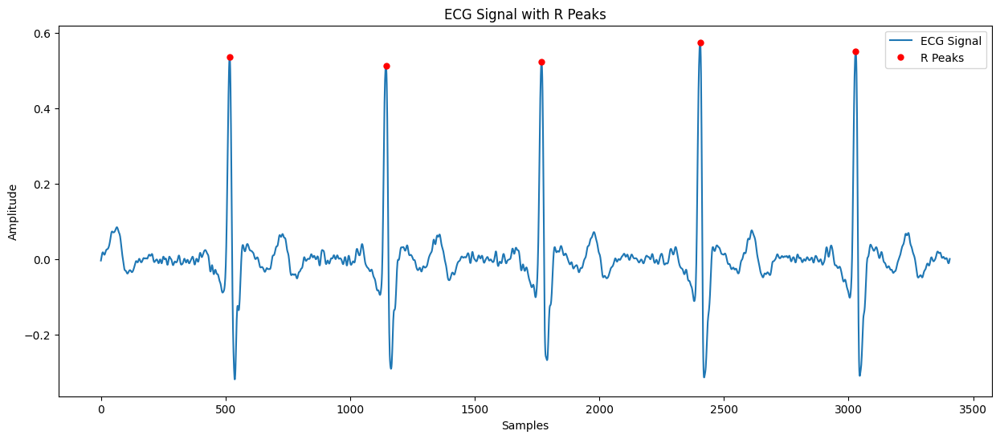

[{'ECG_R_Peaks': array([ 209,  848, 1526, 2259, 3002, 3678, 4385, 5084, 5759, 6396, 7052,
       7733, 8395, 9042, 9677])}, {'ECG_R_Peaks': array([10343, 11068, 11878, 12627, 13280, 13914, 14549, 15212, 15892,
       16535, 17159, 17788, 18453, 19211, 19978])}, {'ECG_R_Peaks': array([20025, 20680, 21333, 22009, 22695, 23386, 24045, 24682, 25306,
       25938, 26603, 27254, 27901, 28546, 29247, 29934])}, {'ECG_R_Peaks': array([30151, 30600, 31218, 31835, 32453, 33091, 33709, 34310, 34890,
       35447, 35971, 36510, 37085, 37686, 38305, 38901, 39461])}, {'ECG_R_Peaks': array([40213, 40528, 41062, 41612, 42171, 42728, 43288, 43801, 44315,
       44840, 45384, 45956, 46509, 47057, 47639, 48455, 49132, 49772])}, {'ECG_R_Peaks': array([50375, 50959, 51537, 52142, 52774, 53426, 54065, 54717, 55311,
       55870, 56410, 56959, 57536, 58155, 58812, 59434])}, {'ECG_R_Peaks': array([60063, 60697, 61351, 61959, 62552, 63124, 63704, 64300, 64938,
       65622, 66313, 66987, 67599, 68180, 68748, 69

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
sampling=800
chunk_size=15000
read_file2=pd.read_csv('/content/your_local_directory/219_ECG-nm.csv')
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,1].values
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='vg')
  lowcut = 1.0
  highcut = 49.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks = pd.DataFrame()
combined_rpeaks = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks)

In [ ]:
hrv_results = nk.hrv(combined_rpeaks, sampling_rate=800, scale=(4, 16))
csv_file = 'combined.csv'
if os.path.exists(csv_file):
    existing_data = pd.read_csv(csv_file)
    updated_data = pd.concat([existing_data, hrv_results], ignore_index=True)
    updated_data.to_csv(csv_file, index=False)
else:
    hrv_results.to_csv(csv_file, index=False)

print(hrv_results)


   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  783.004386  81.039454    9.194826   80.250962         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  79.016227  79.190806  ...    1.255704    6.904548   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD  HRV_HFD   HRV_KFD  \
0     0.946042  1.343993   1.316178    1.906836  1.494353  1.80172  2.042769   

   HRV_LZC  
0  0.79016  

[1 rows x 91 columns]


**#138______________________________________________**

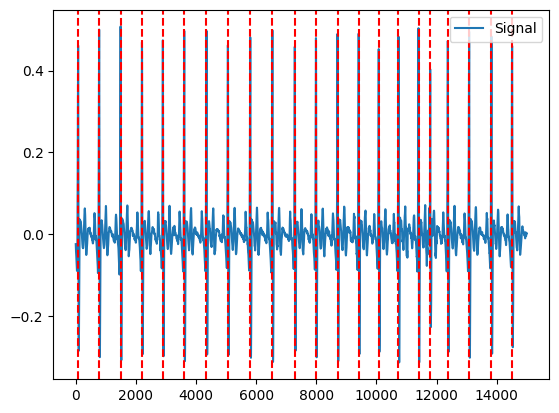

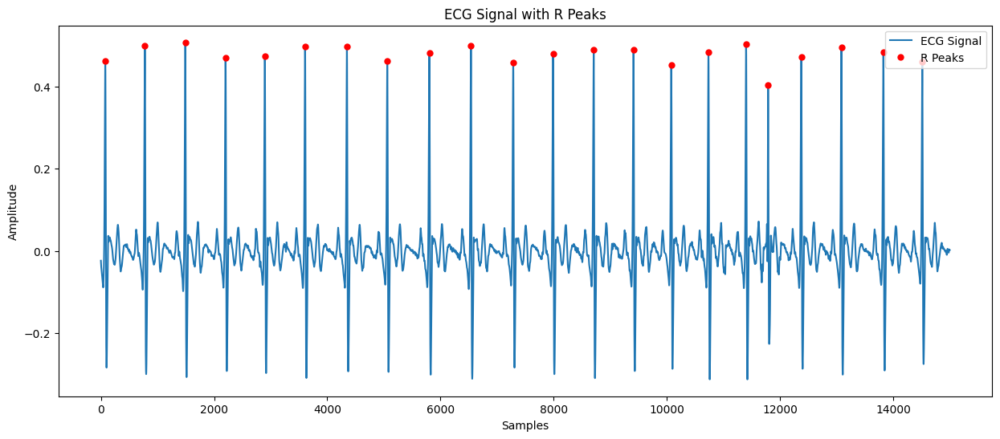

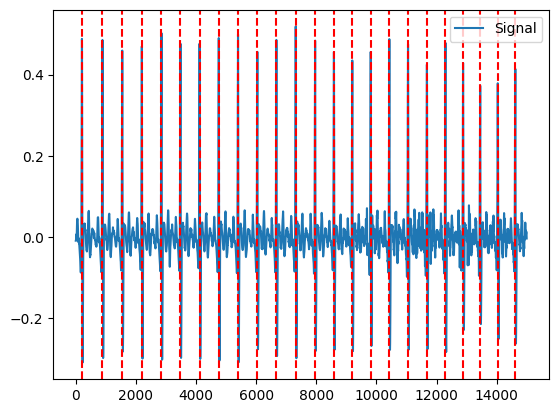

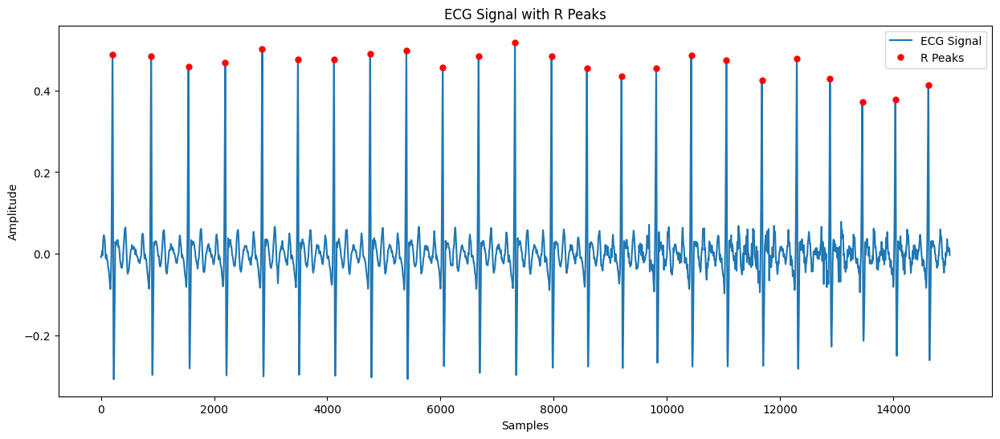

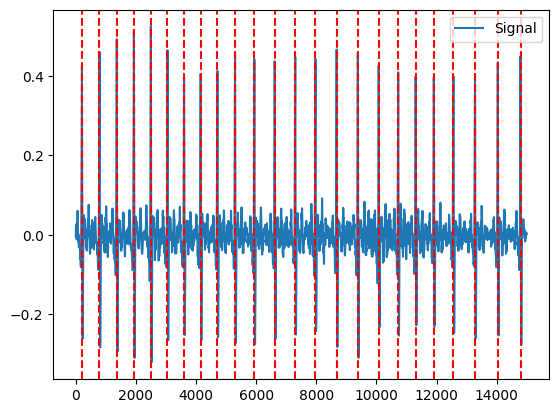

...

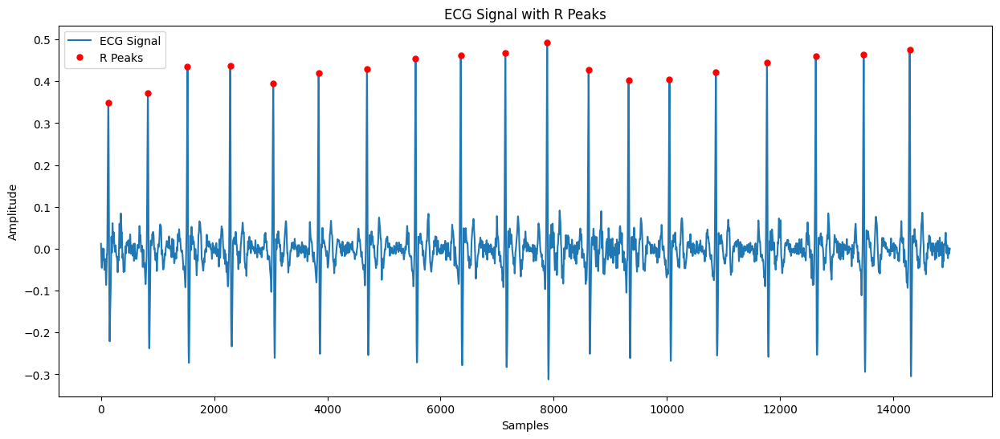

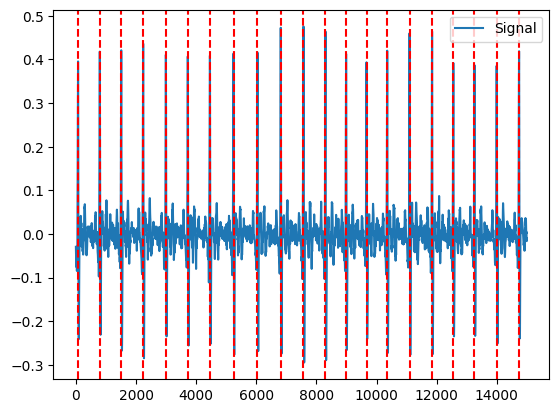

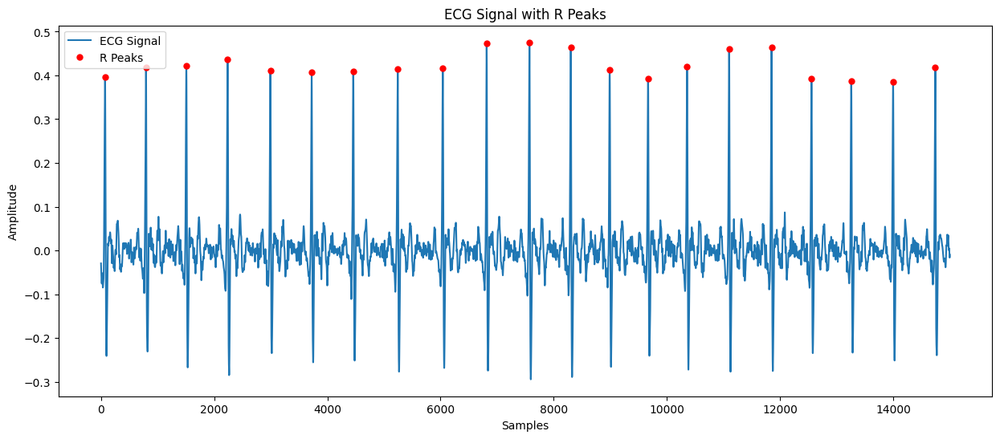

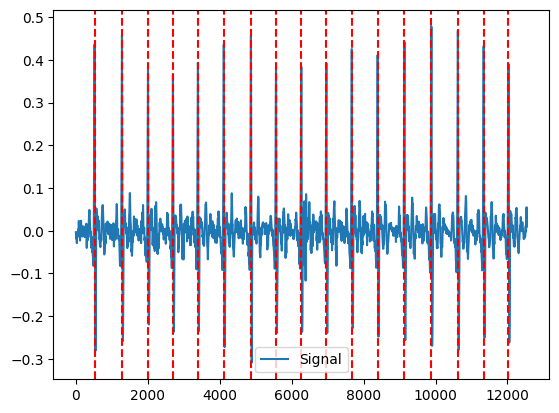

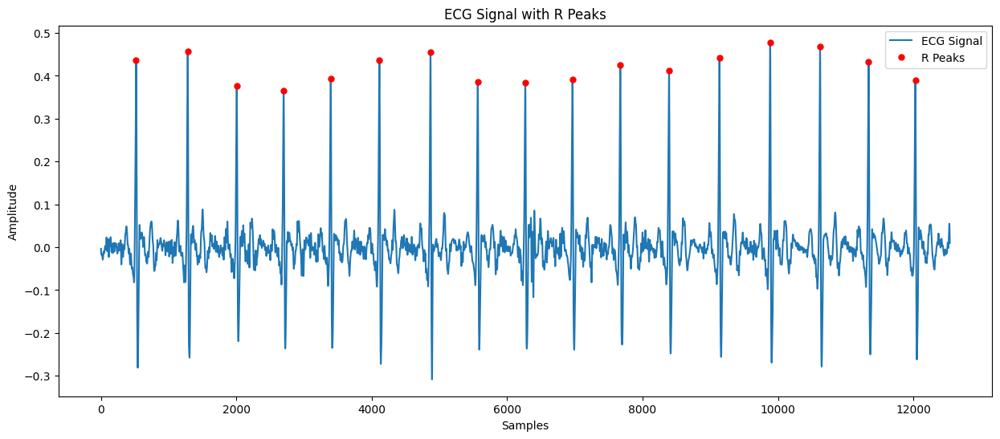

[{'ECG_R_Peaks': array([   78,   777,  1491,  2202,  2897,  3608,  4347,  5060,  5804,
        6539,  7286,  7990,  8707,  9411, 10078, 10735, 11401, 11789,
       12376, 13085, 13826, 14514])}, {'ECG_R_Peaks': array([15205, 15888, 16546, 17197, 17850, 18481, 19118, 19757, 20397,
       21039, 21673, 22316, 22962, 23587, 24198, 24811, 25430, 26052,
       26680, 27296, 27883, 28453, 29037, 29621])}, {'ECG_R_Peaks': array([30205, 30789, 31364, 31933, 32497, 33051, 33602, 34154, 34711,
       35298, 35940, 36618, 37300, 37972, 38677, 39382, 40077, 40725,
       41306, 41910, 42560, 43280, 44037, 44795])}, {'ECG_R_Peaks': array([45519, 46209, 46907, 47582, 48225, 48865, 49505, 50163, 50805,
       51452, 52109, 52803, 53514, 54245, 55004, 55789, 56566, 57266,
       57948, 58642, 59360])}, {'ECG_R_Peaks': array([60123, 60892, 61610, 62329, 63089, 63862, 64597, 65345, 66073,
       66770, 67444, 68093, 68734, 69401, 70121, 70828, 71540, 72303,
       73084, 73846, 74590])}, {'ECG_R_Peaks':

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
chunk_size=15000
sampling=800
read_file2=pd.read_csv('/content/your_local_directory/138_ECG-mj.csv')
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,2].values
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='vg')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks1 = pd.DataFrame()
combined_rpeaks1 = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks1)

In [ ]:
hrv_results1 = nk.hrv(combined_rpeaks1, sampling_rate=100, scale=(4, 16))
print(hrv_results1)
hrv_results1.to_csv('combined1.csv', index=False)

    HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  7165.929204  746.306624  596.131362  364.122486  580.450155  430.615264   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD    HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0  569.895368   576.66589  446.05331  447.047634  ...    1.203973    7.093727   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD   HRV_HFD   HRV_KFD  \
0     0.859204  1.171314   1.224474    1.759441  1.577282  1.758118  2.282132   

    HRV_LZC  
0  0.692051  

[1 rows x 91 columns]


In [ ]:
hrv_results1 = nk.hrv(combined_rpeaks1, sampling_rate=800, scale=(4, 16))
csv_file = 'combined.csv'
if os.path.exists(csv_file):
    existing_data = pd.read_csv(csv_file)
    updated_data = pd.concat([existing_data, hrv_results1], ignore_index=True)
    updated_data.to_csv(csv_file, index=False)
else:
    hrv_results1.to_csv(csv_file, index=False)

print(hrv_results1)

   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0   895.74115  93.288328   78.074913   74.131006         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  55.756664  55.880954  ...    1.203973    7.093727   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn   HRV_CD   HRV_HFD   HRV_KFD  \
0     0.859204  1.171314   1.224474    1.759441  1.56464  1.758118  2.282132   

    HRV_LZC  
0  0.692051  

[1 rows x 91 columns]


In [ ]:
import pandas as pd
df=pd.read_csv('/content/219_ECG.csv')
df['time'] = pd.to_datetime(df['time'])
total_time = (df['time'].max() - df['time'].min()).total_seconds()
print(f"Total time: {total_time:.2f} seconds")
n= len(df)//total_time
print(n)

Total time: 147.00 seconds
975.0


**#152_______________________________________**

Total time: 147.00 seconds
975.0


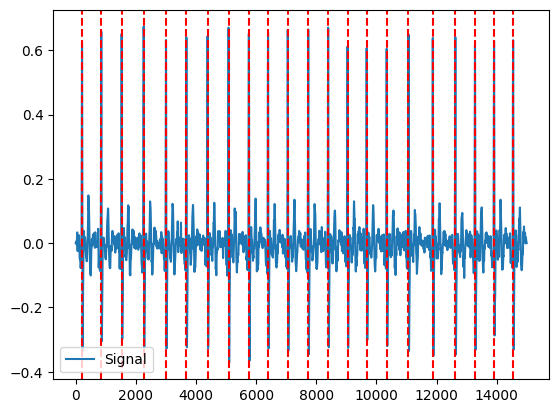

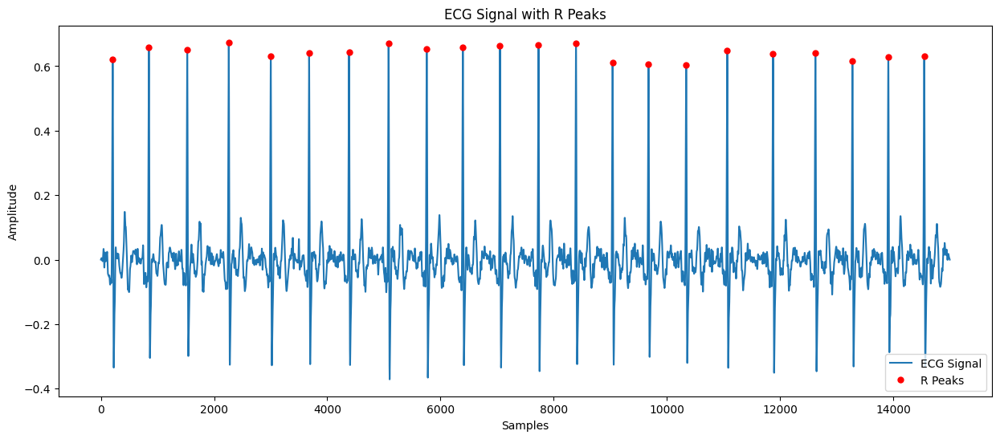

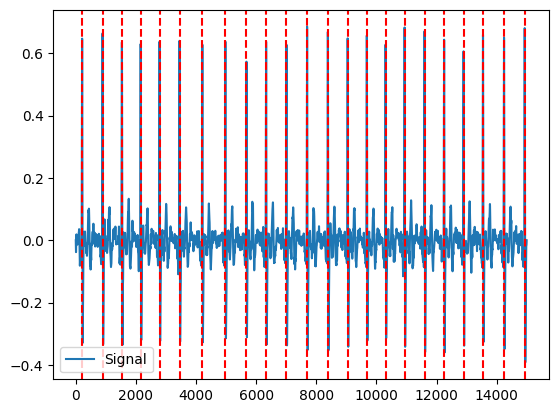

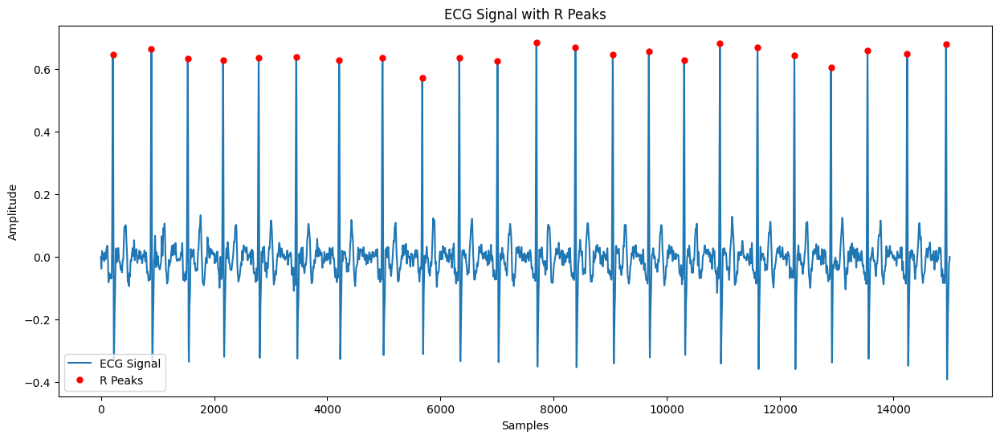

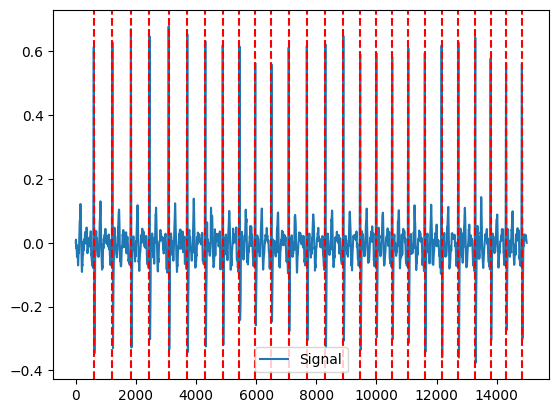

...

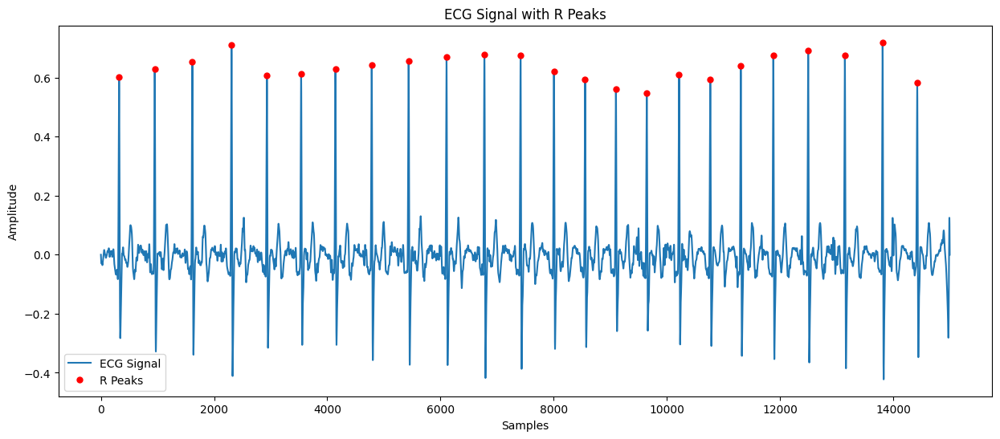

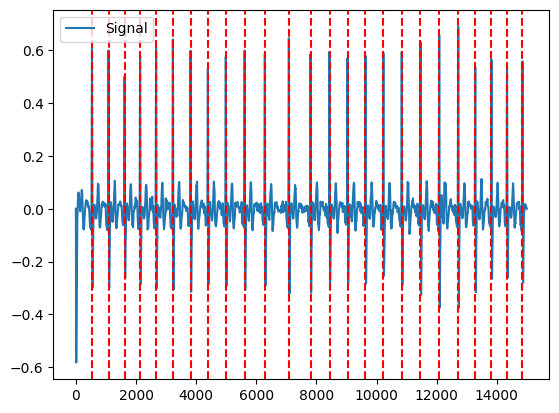

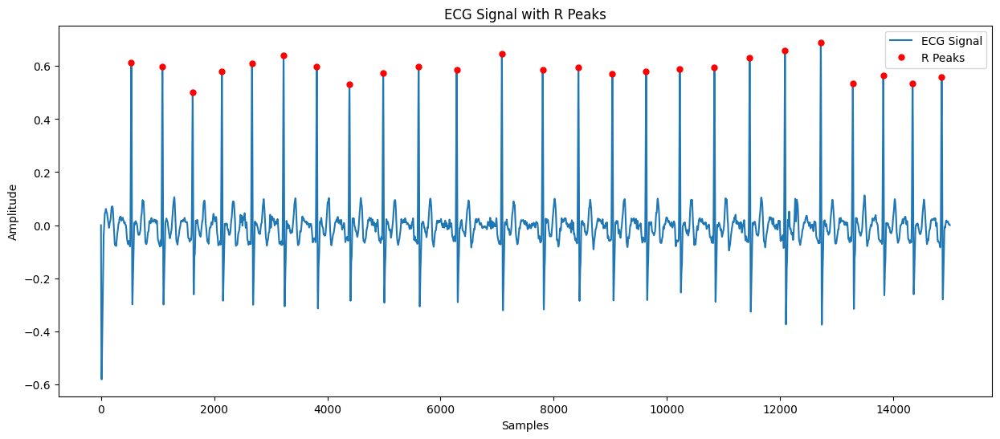

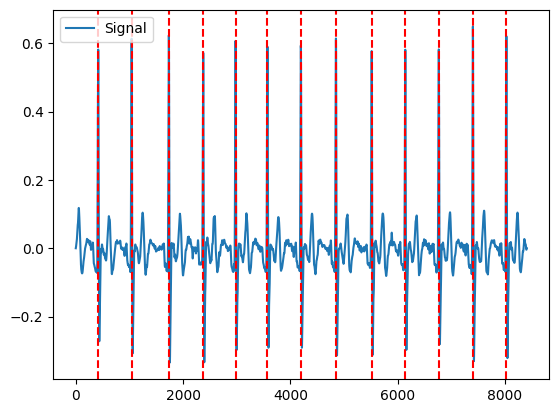

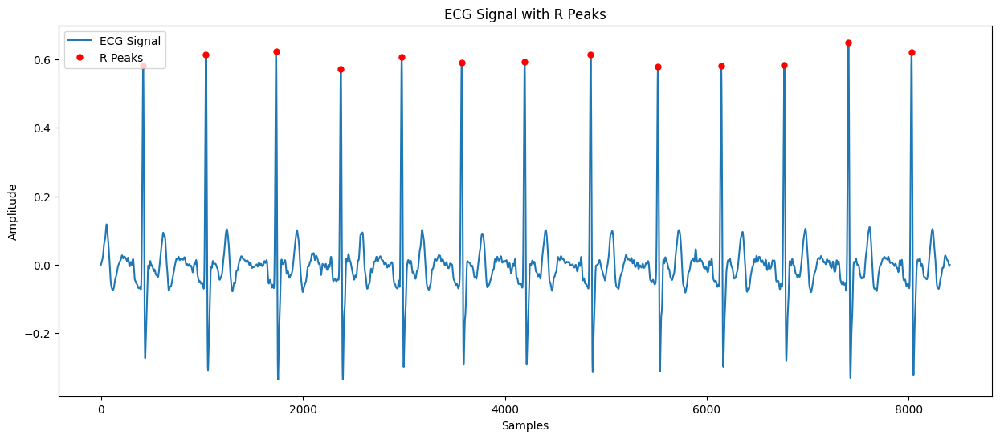

[{'ECG_R_Peaks': array([  208,   848,  1526,  2259,  3001,  3679,  4384,  5083,  5758,
        6396,  7052,  7732,  8395,  9041,  9676, 10342, 11067, 11876,
       12626, 13279, 13914, 14548])}, {'ECG_R_Peaks': array([15212, 15891, 16534, 17158, 17787, 18452, 19210, 19976, 20678,
       21332, 22008, 22695, 23385, 24044, 24681, 25305, 25938, 26602,
       27253, 27900, 28546, 29246, 29933])}, {'ECG_R_Peaks': array([30599, 31218, 31834, 32451, 33090, 33709, 34309, 34889, 35445,
       35970, 36508, 37083, 37685, 38303, 38900, 39461, 39998, 40526,
       41061, 41611, 42169, 42727, 43288, 43800, 44314, 44839])}, {'ECG_R_Peaks': array([45382, 45955, 46508, 47056, 47637, 48454, 49131, 49772, 50374,
       50958, 51536, 52140, 52773, 53425, 54065, 54716, 55310, 55869,
       56409, 56958, 57535, 58154, 58811, 59433])}, {'ECG_R_Peaks': array([60061, 60695, 61351, 61958, 62551, 63124, 63703, 64299, 64938,
       65621, 66311, 66986, 67598, 68179, 68746, 69340, 69971, 70583,
       71180, 7179

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
chunk_size=15000
read_file2=pd.read_csv('/content/219_ECG.csv')
read_file2['time'] = pd.to_datetime(read_file2['time'])
total_time = (read_file2['time'].max() - read_file2['time'].min()).total_seconds()
print(f"Total time: {total_time:.2f} seconds")
n= len(read_file2)//total_time
print(n)
sampling=int(n)
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,1].values
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='vg')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    padlen = min(len(ecg_cleaned2) - 1, int(0.25 * len(ecg_cleaned2)))
    y = signal.filtfilt(b, a, ecg_cleaned2, padlen=padlen)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks2 = pd.DataFrame()
combined_rpeaks2 = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks2)

In [ ]:
import neurokit2 as nk
import numpy as np
import matplotlib.pyplot as plt

# Load your ECG data
ecg_signal, _ = nk.ecg_load("your_ecg_data.csv")

# Preprocess the ECG signal
ecg_signal, _ = nk.ecg_preprocess(ecg_signal, sampling_rate=1000)

# Compute the R-peaks
rpeaks, _ = nk.ecg_peaks(ecg_signal, sampling_rate=1000)

# Define a function to detect noisy areas
def detect_noisy_areas(ecg_signal, rpeaks, threshold=0.5):
    """
    Detect areas where R-peaks are not detected correctly (i.e., noisy areas)
    """
    noisy_areas = []
    for i in range(1, len(rpeaks) - 1):
        if np.abs(rpeaks[i] - rpeaks[i-1]) > threshold * (rpeaks[i+1] - rpeaks[i-1]):
            noisy_areas.append((rpeaks[i-1], rpeaks[i+1]))
    return noisy_areas

# Detect noisy areas
noisy_areas = detect_noisy_areas(ecg_signal, rpeaks)

# Remove noisy areas from the ECG signal and R-peaks
new_ecg_signal = ecg_signal.copy()
new_rpeaks = rpeaks.copy()
for area in noisy_areas:
    start, end = area
    new_ecg_signal = np.delete(new_ecg_signal, np.arange(start, end))
    new_rpeaks = new_rpeaks[new_rpeaks < start] + new_rpeaks[new_rpeaks > end] - (end - start)

# Re-compute R-peaks on the cleaned signal
new_rpeaks, _ = nk.ecg_peaks(new_ecg_signal, sampling_rate=1000)

# Plot the original and cleaned signals with R-peaks
plt.figure(figsize=(12, 6))
plt.plot(ecg_signal, label="Original signal")
plt.plot(rpeaks, ecg_signal[rpeaks], "ro", label="Original R-peaks")
plt.plot(new_ecg_signal, label="Cleaned signal")
plt.plot(new_rpeaks, new_ecg_signal[new_rpeaks], "go", label="Cleaned R-peaks")
plt.legend()
plt.show()

In [ ]:
hrv_results2 = nk.hrv(combined_rpeaks2, sampling_rate=100, scale=(4, 16))
print(hrv_results2)
hrv_results2.to_csv('combined2.csv', index=False)

    HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  5482.168675  527.909653  377.404466  287.270601  400.519787  340.016932   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_SampEn  \
0  332.076581  402.802646  406.495742  407.636564  ...    0.885144   

   HRV_ShanEn  HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn   HRV_CD  \
0    6.393305       0.6906  0.973828   1.222146    1.598392  1.21672   

    HRV_HFD   HRV_KFD   HRV_LZC  
0  1.734034  1.748753  0.666419  

[1 rows x 91 columns]


In [ ]:
hrv_results2 = nk.hrv(combined_rpeaks2, sampling_rate=800, scale=(4, 16))
csv_file = 'combined.csv'
if os.path.exists(csv_file):
    existing_data = pd.read_csv(csv_file)
    updated_data = pd.concat([existing_data, hrv_results2], ignore_index=True)
    updated_data.to_csv(csv_file, index=False)
else:
    hrv_results2.to_csv(csv_file, index=False)

print(hrv_results2)

   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  685.271084  65.988707         NaN         NaN         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  50.811968  50.954571  ...    0.885144    6.393305   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD   HRV_HFD   HRV_KFD  \
0       0.6906  0.973828   1.222146    1.598392  1.207308  1.734034  1.748753   

    HRV_LZC  
0  0.666419  

[1 rows x 91 columns]


**#125_________________________________________**

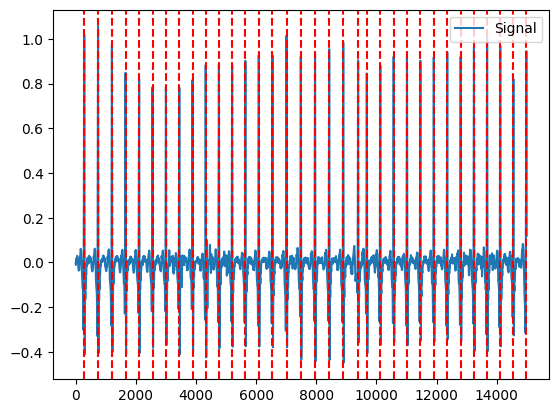

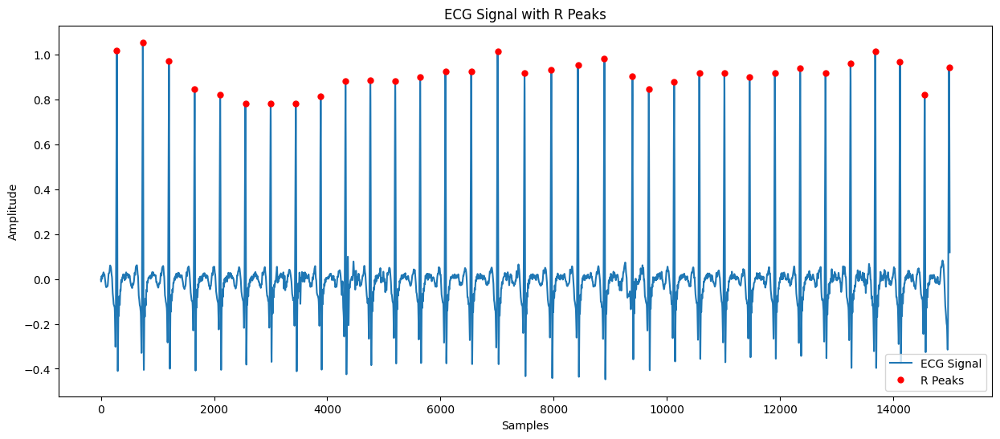

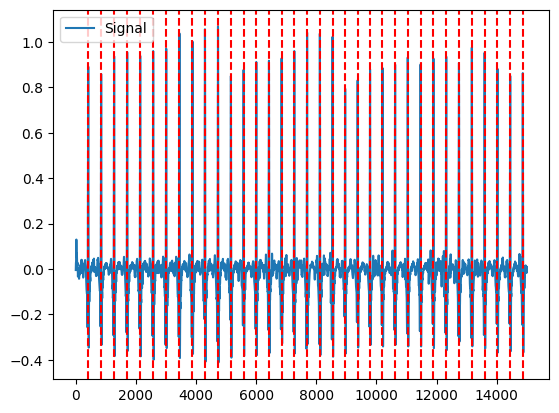

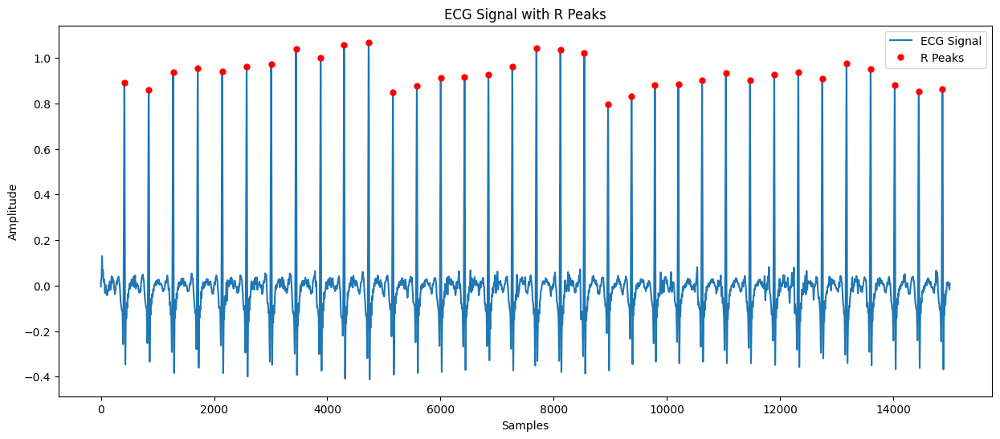

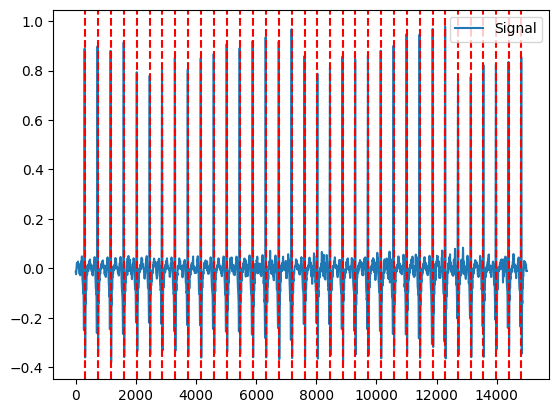

...

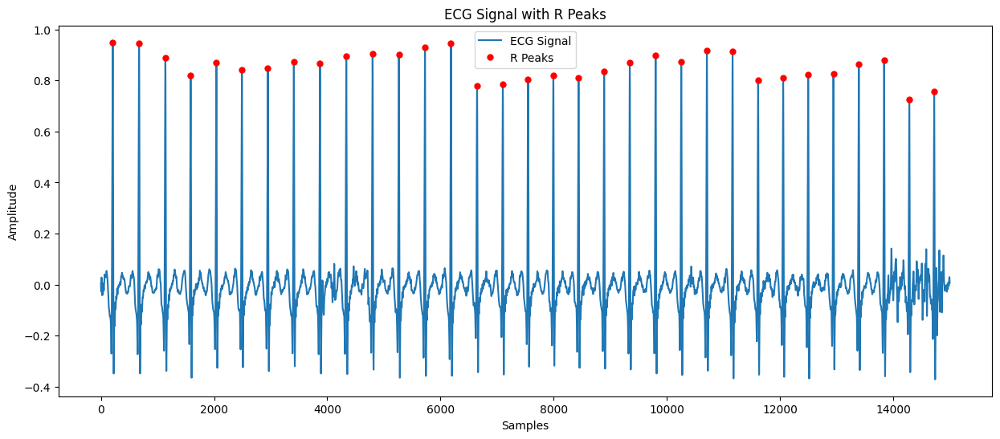

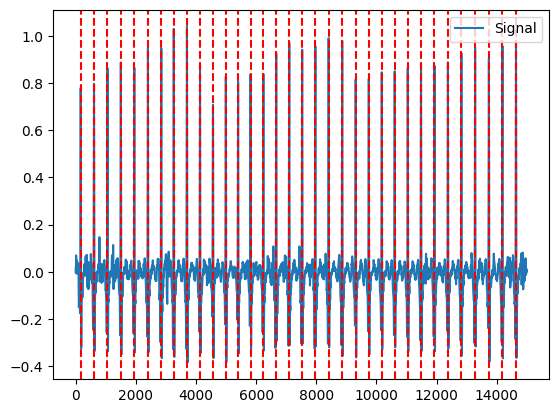

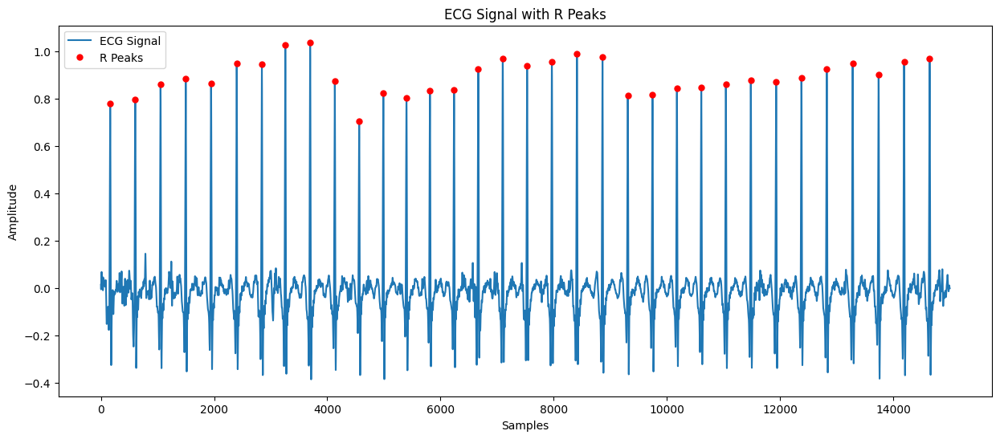

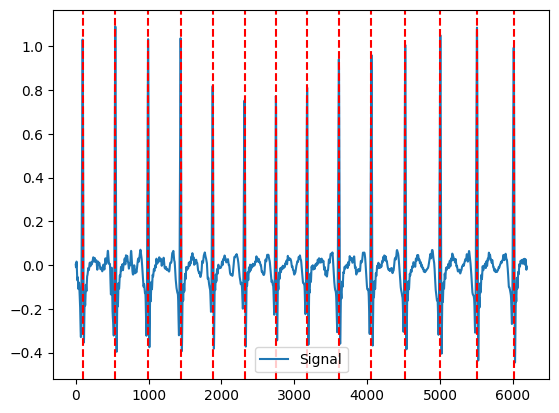

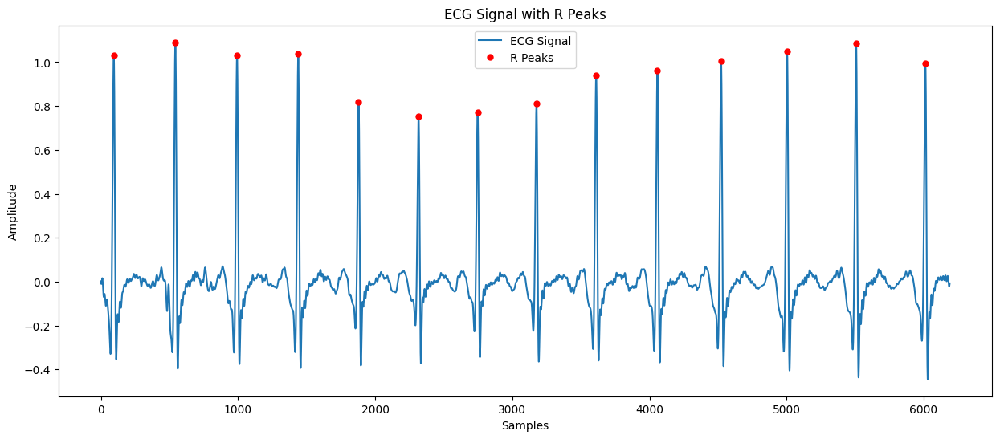

[{'ECG_R_Peaks': array([  281,   741,  1202,  1656,  2107,  2553,  2999,  3443,  3884,
        4322,  4761,  5201,  5641,  6087,  6543,  7011,  7485,  7959,
        8429,  8897,  9392,  9681, 10129, 10574, 11017, 11462, 11909,
       12356, 12803, 13245, 13682, 14119, 14556, 14987])}, {'ECG_R_Peaks': array([15415, 15845, 16276, 16710, 17143, 17575, 18009, 18448, 18882,
       19297, 19731, 20160, 20583, 21005, 21426, 21847, 22269, 22695,
       23119, 23542, 23961, 24377, 24789, 25203, 25623, 26043, 26469,
       26897, 27323, 27746, 28174, 28600, 29026, 29451, 29870])}, {'ECG_R_Peaks': array([30295, 30725, 31159, 31594, 32029, 32459, 32869, 33296, 33726,
       34157, 34588, 35019, 35451, 35883, 36317, 36751, 37179, 37610,
       38036, 38456, 38874, 39294, 39719, 40143, 40572, 41004, 41436,
       41872, 42286, 42715, 43139, 43558, 43976, 44396, 44818])}, {'ECG_R_Peaks': array([45247, 45672, 46102, 46539, 46981, 47424, 47867, 48303, 48737,
       49168, 49591, 50009, 50426, 50848, 51

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
chunk_size=15000
sampling=800
read_file2=pd.read_csv('/content/your_local_directory/125_ECG.csv')
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,2].values
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='engzeemod2012')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks1 = pd.DataFrame()
combined_rpeaks1 = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks1)

In [ ]:
hrv_results1 = nk.hrv(combined_rpeaks1, sampling_rate=100, scale=(4, 16))
print(hrv_results1)
hrv_results1.to_csv('combined2.csv', index=False)

    HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  4411.614035  186.89322   124.55121  109.672128  120.235632  120.316665   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_SampEn  \
0   86.609176  155.754441  171.125109  171.420157  ...     0.94021   

   HRV_ShanEn  HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD  \
0    5.778115     0.663064  1.172917   1.288815     1.66772  1.150929   

    HRV_HFD   HRV_KFD   HRV_LZC  
0  1.634568  1.706821  0.486428  

[1 rows x 91 columns]


In [ ]:
hrv_results1 = nk.hrv(combined_rpeaks1, sampling_rate=800, scale=(4, 16))
csv_file = 'combined.csv'
if os.path.exists(csv_file):
    existing_data = pd.read_csv(csv_file)
    updated_data = pd.concat([existing_data, hrv_results1], ignore_index=True)
    updated_data.to_csv(csv_file, index=False)
else:
    hrv_results1.to_csv(csv_file, index=False)

print(hrv_results1)

   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  551.451754  23.361653    9.764477   20.729222         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD  HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  21.390639  21.42752  ...     0.94021    5.778115   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD   HRV_HFD   HRV_KFD  \
0     0.663064  1.172917   1.288815     1.66772  1.121915  1.634568  1.706821   

    HRV_LZC  
0  0.486428  

[1 rows x 91 columns]


**#102_________________________________________**

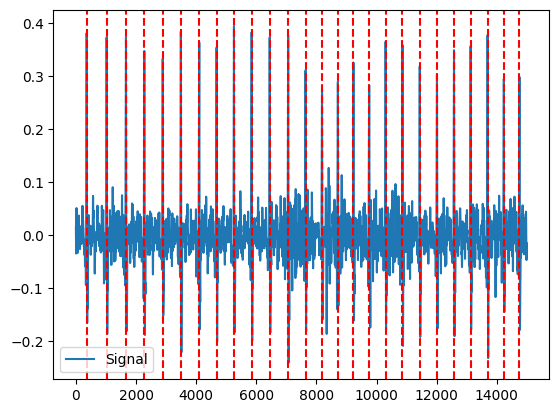

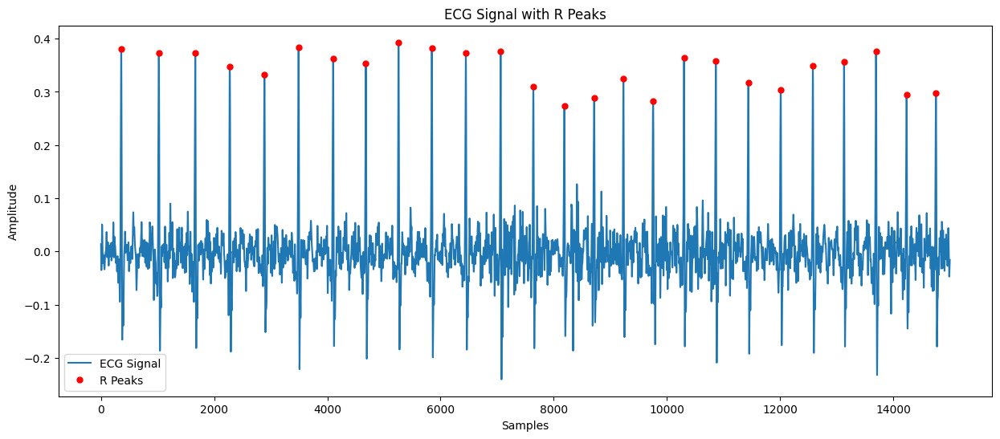

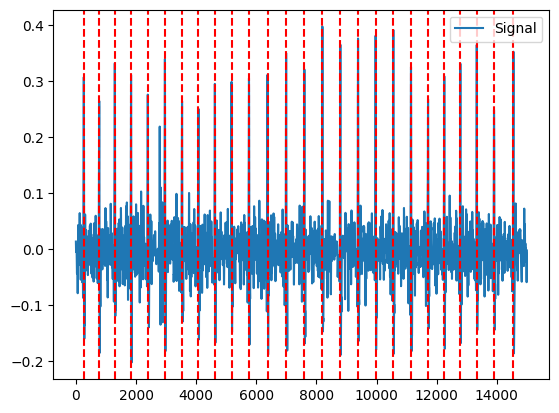

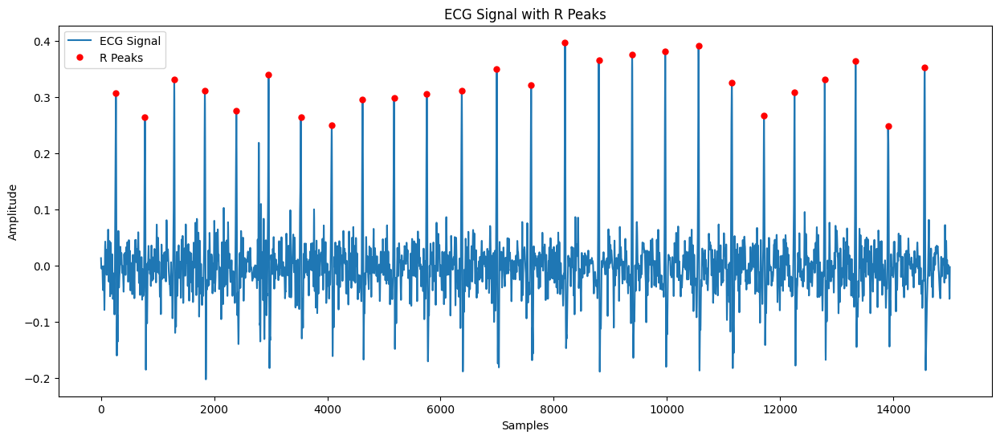

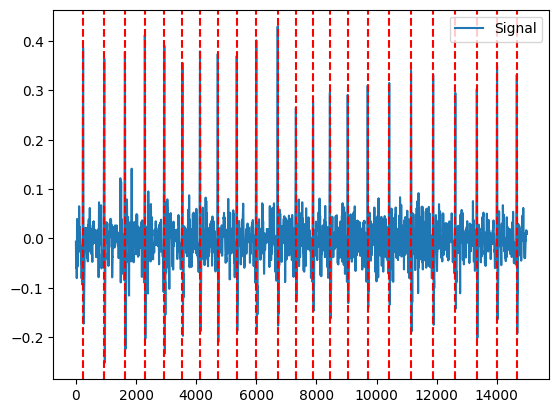

...

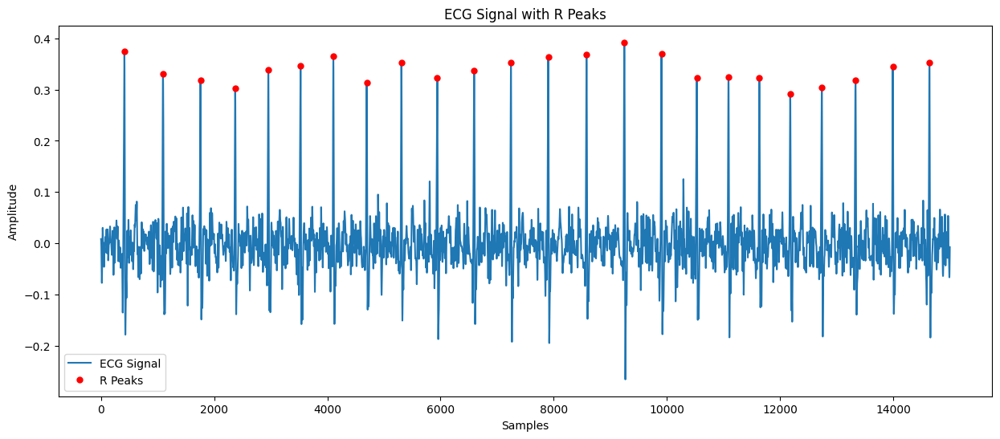

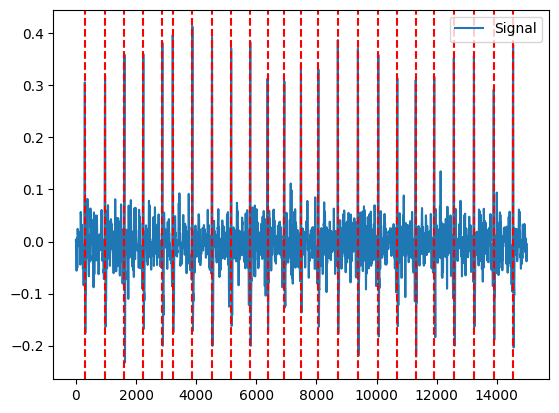

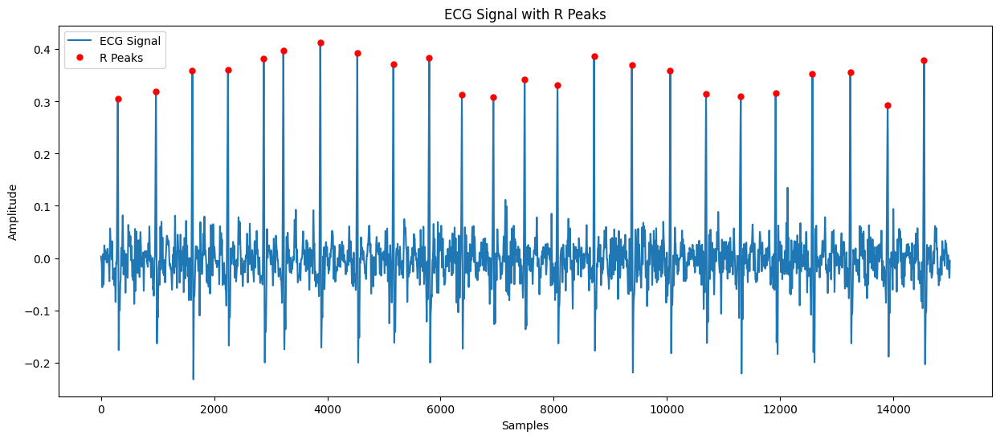

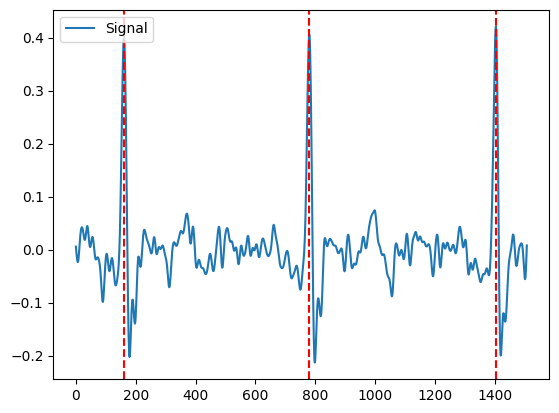

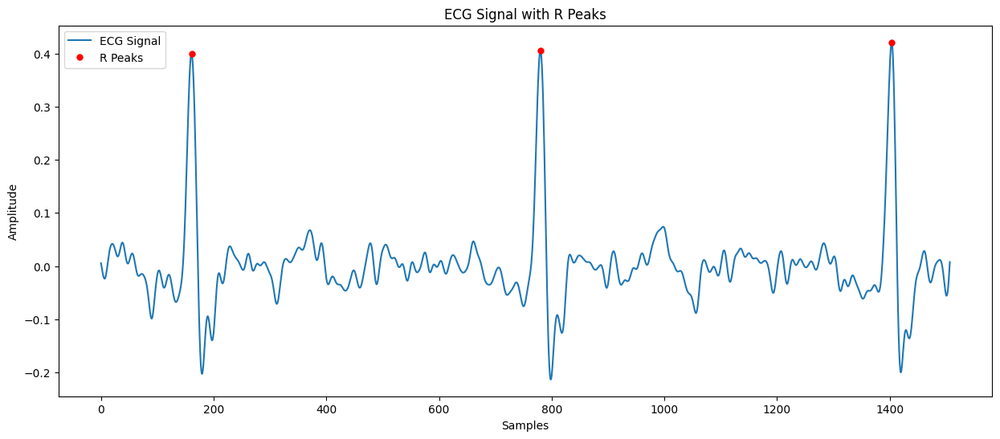

[{'ECG_R_Peaks': array([  358,  1022,  1666,  2275,  2888,  3491,  4103,  4680,  5258,
        5846,  6447,  7061,  7639,  8187,  8714,  9231,  9755, 10302,
       10864, 11438, 12010, 12578, 13130, 13694, 14235, 14753])}, {'ECG_R_Peaks': array([15263, 15776, 16294, 16835, 17391, 17961, 18531, 19076, 19622,
       20178, 20757, 21375, 21993, 22600, 23199, 23796, 24385, 24970,
       25559, 26147, 26714, 27254, 27788, 28334, 28908, 29553])}, {'ECG_R_Peaks': array([30240, 30944, 31630, 32293, 32941, 33544, 34128, 34718, 35349,
       36001, 36712, 37317, 37889, 38449, 39041, 39706, 40423, 41148,
       41884, 42621, 43336, 44009, 44666])}, {'ECG_R_Peaks': array([45337, 46018, 46730, 47434, 48141, 48816, 49442, 50058, 50734,
       51430, 52168, 52813, 53437, 54062, 54731, 55426, 56128, 56812,
       57485, 58125, 58735, 59357, 59936])}, {'ECG_R_Peaks': array([60139, 60498, 61058, 61651, 62296, 62980, 63851, 64580, 65247,
       65851, 66434, 67030, 67643, 68300, 68940, 69592, 70242, 7090

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
chunk_size=15000
sampling=800
read_file2=pd.read_csv('/content/your_local_directory/102_ECG.csv')
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,2].values
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='engzeemod2012')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks1 = pd.DataFrame()
combined_rpeaks1 = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks1)

In [ ]:
hrv_results1 = nk.hrv(combined_rpeaks1, sampling_rate=800, scale=(4, 16))
print(hrv_results1)
hrv_results1.to_csv('combined2.csv', index=False)

   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  789.192015  88.080683   42.229438   81.273887         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  62.117724  62.236316  ...    1.144116    7.197006   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn   HRV_CD   HRV_HFD   HRV_KFD  \
0     0.877927  1.393843   1.325038    1.810772  1.47112  1.736464  2.079313   

    HRV_LZC  
0  0.672457  

[1 rows x 91 columns]


In [ ]:
hrv_results1 = nk.hrv(combined_rpeaks1, sampling_rate=800, scale=(4, 16))
csv_file = 'combined.csv'
if os.path.exists(csv_file):
    existing_data = pd.read_csv(csv_file)
    updated_data = pd.concat([existing_data, hrv_results1], ignore_index=True)
    updated_data.to_csv(csv_file, index=False)
else:
    hrv_results1.to_csv(csv_file, index=False)

print(hrv_results1)

   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  789.192015  87.641384   32.931948   84.856488         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  64.921874  65.045845  ...    1.159521    7.197006   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD   HRV_HFD   HRV_KFD  \
0     0.870615  1.458794   1.318239    1.772923  1.487278  1.737087  2.042974   

    HRV_LZC  
0  0.672457  

[1 rows x 91 columns]


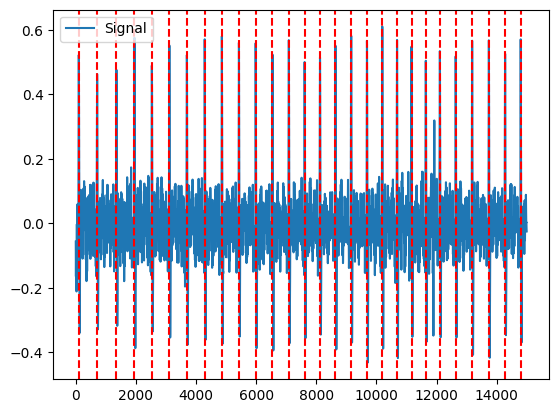

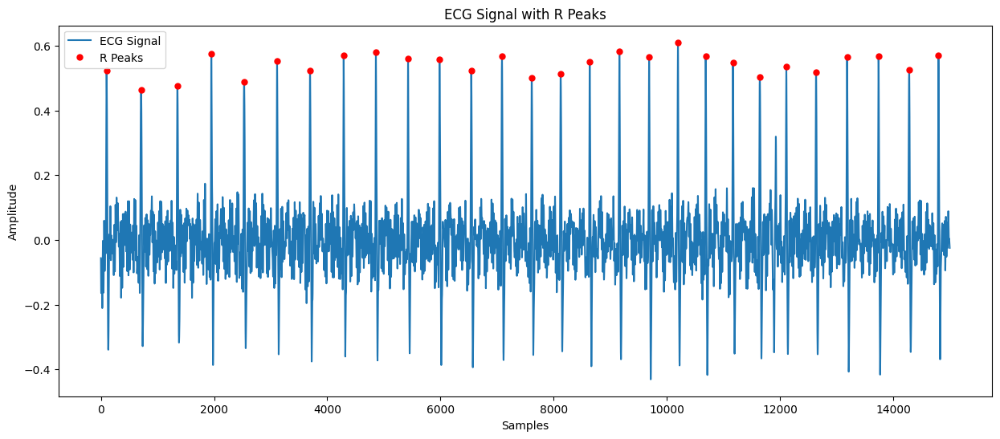

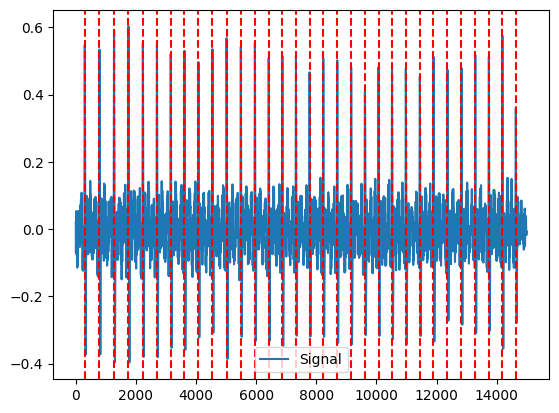

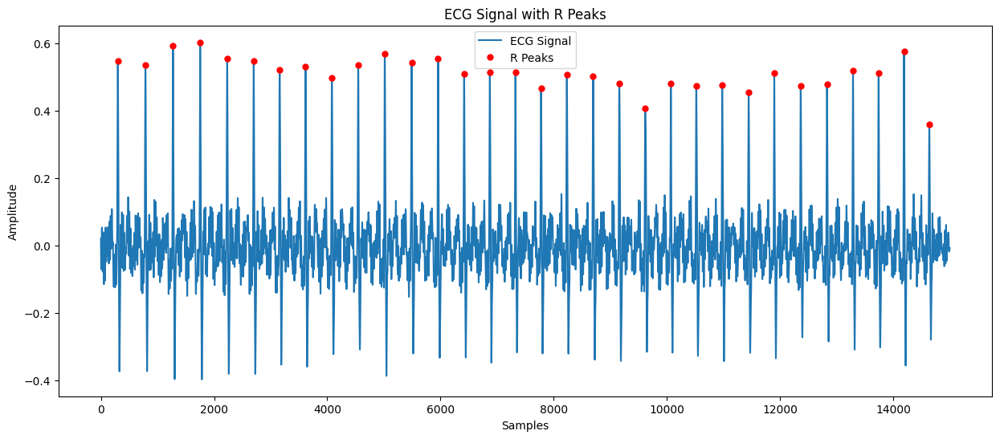

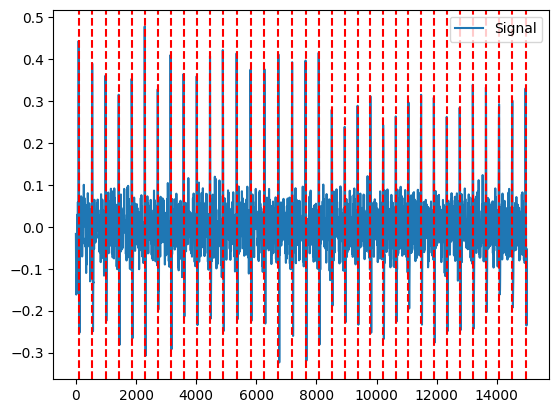

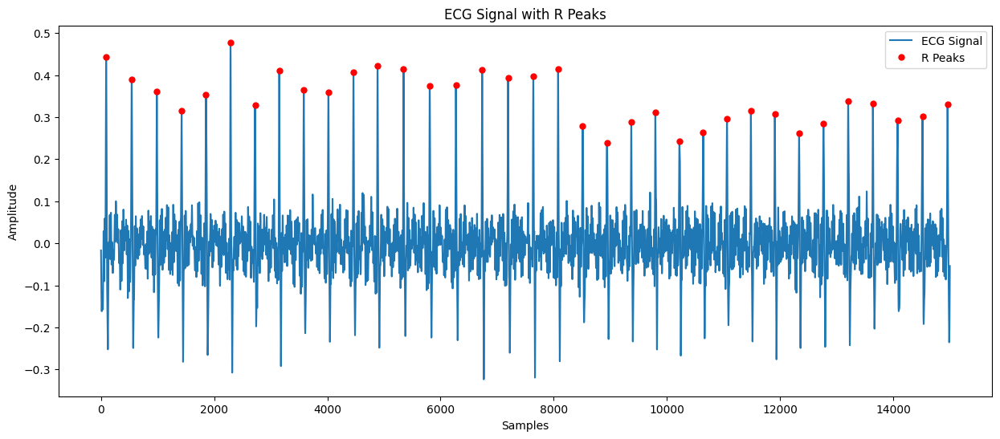

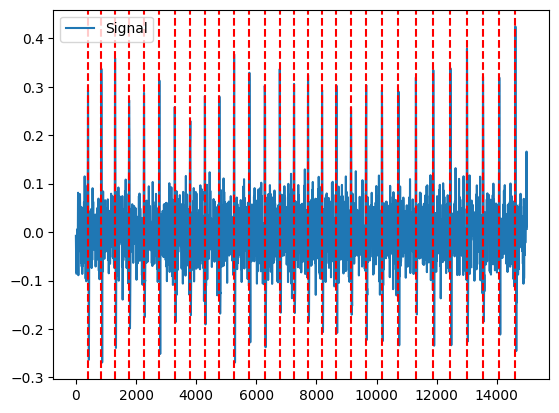

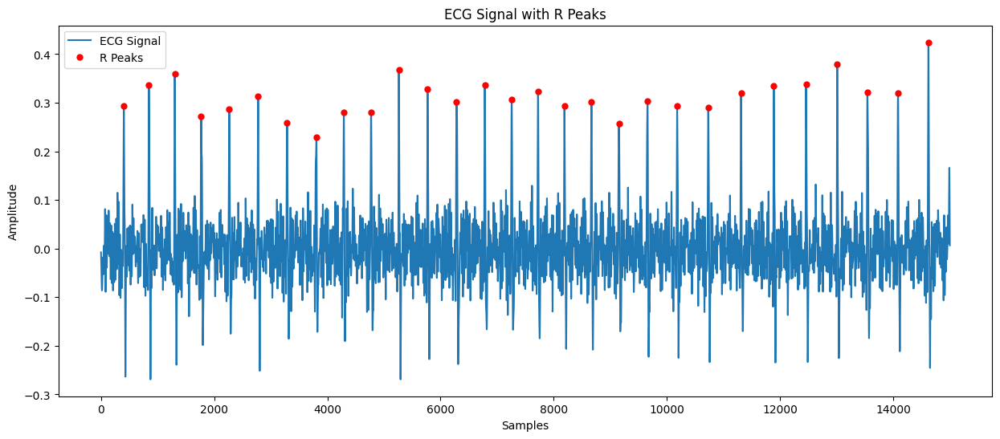

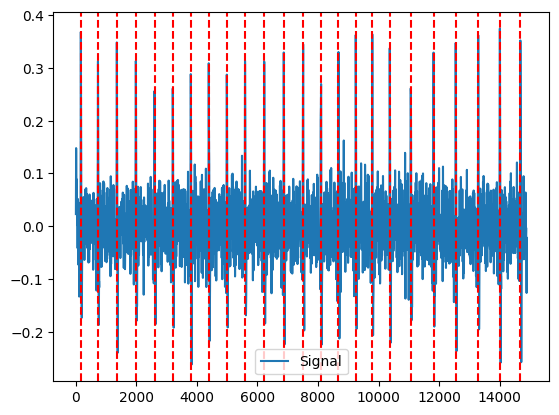

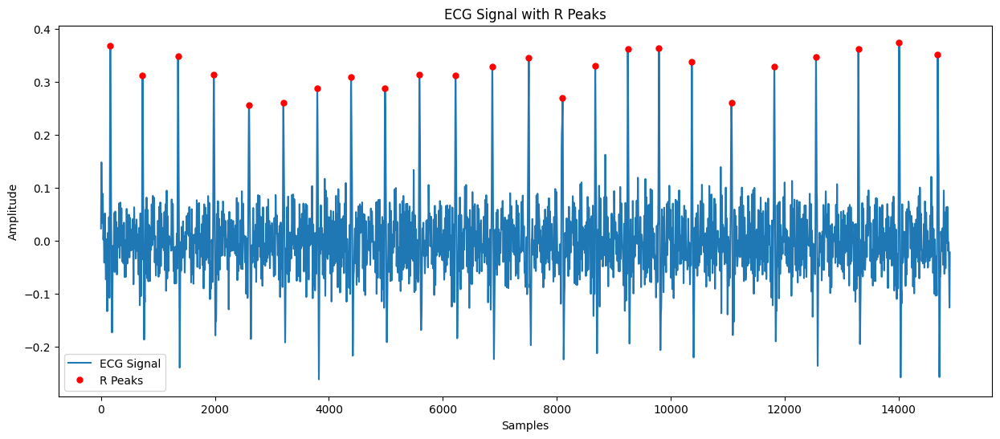

[{'ECG_R_Peaks': array([  100,   710,  1352,  1952,  2530,  3113,  3696,  4289,  4859,
        5427,  5984,  6544,  7087,  7613,  8124,  8637,  9162,  9686,
       10196, 10687, 11169, 11643, 12111, 12637, 13185, 13741, 14282,
       14800])}, {'ECG_R_Peaks': array([15299, 15787, 16274, 16754, 17232, 17700, 18159, 18616, 19081,
       19547, 20016, 20491, 20958, 21418, 21872, 22324, 22777, 23233,
       23698, 24160, 24618, 25071, 25520, 25979, 26445, 26898, 27365,
       27830, 28289, 28741, 29191, 29638])}, {'ECG_R_Peaks': array([30091, 30542, 30986, 31424, 31855, 32289, 32722, 33149, 33582,
       34018, 34461, 34887, 35346, 35809, 36271, 36735, 37193, 37639,
       38077, 38511, 38940, 39370, 39795, 40220, 40640, 41061, 41483,
       41906, 42335, 42766, 43202, 43639, 44076, 44516, 44958])}, {'ECG_R_Peaks': array([45403, 45846, 46303, 46770, 47266, 47776, 48288, 48806, 49291,
       49773, 50263, 50771, 51283, 51781, 52256, 52722, 53189, 53666,
       54151, 54657, 55180, 55730, 56

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
sampling=800
chunk_size=15000
read_file2=pd.read_csv('/content/210_ECG.csv')
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,1].values
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='engzeemod2012')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks = pd.DataFrame()
combined_rpeaks = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks)

In [ ]:
hrv_results = nk.hrv(combined_rpeaks, sampling_rate=800, scale=(4, 16))
csv_file = 'combined.csv'
if os.path.exists(csv_file):
    existing_data = pd.read_csv(csv_file)
    updated_data = pd.concat([existing_data, hrv_results], ignore_index=True)
    updated_data.to_csv(csv_file, index=False)
else:
    hrv_results.to_csv(csv_file, index=False)

print(hrv_results)

   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  634.243197  92.645498         NaN         NaN         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  23.369336  23.442503  ...    0.365761    6.590762   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD   HRV_HFD   HRV_KFD  \
0      0.42658  0.654597   0.897632    0.951184  1.135199  1.527451  1.792309   

    HRV_LZC  
0  0.391819  

[1 rows x 91 columns]


86200
0 15000


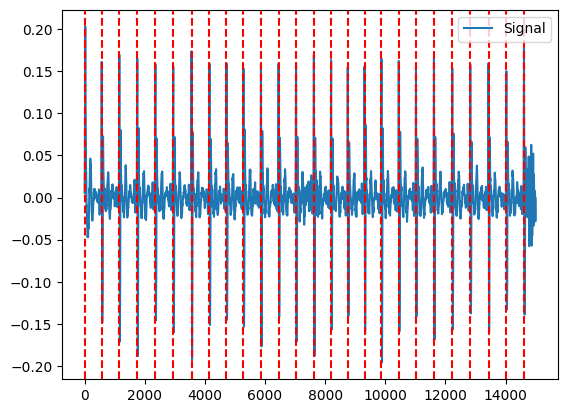

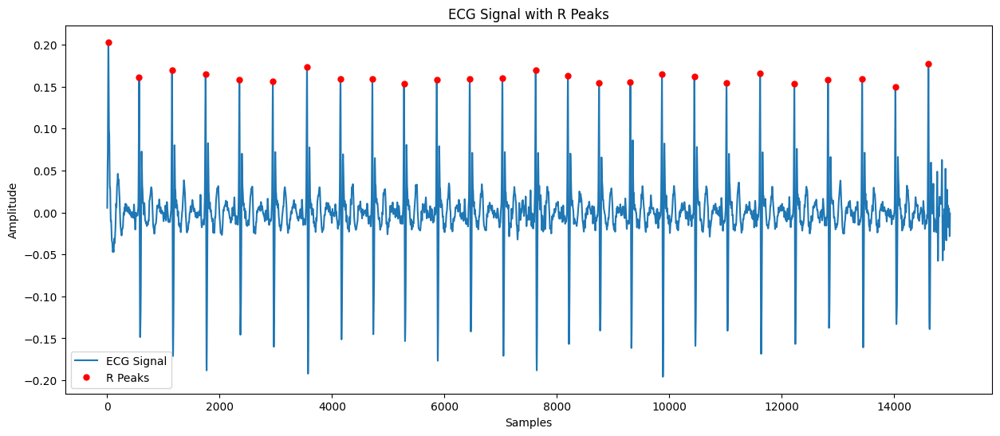

15000 30000


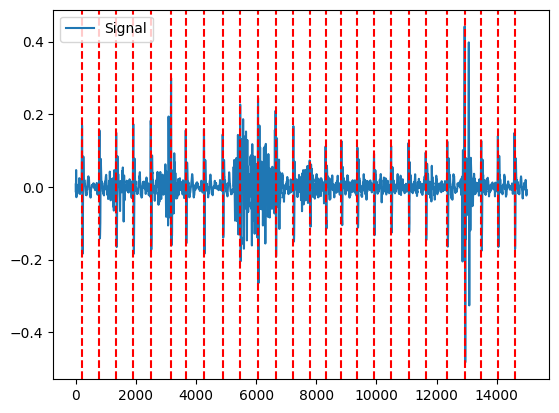

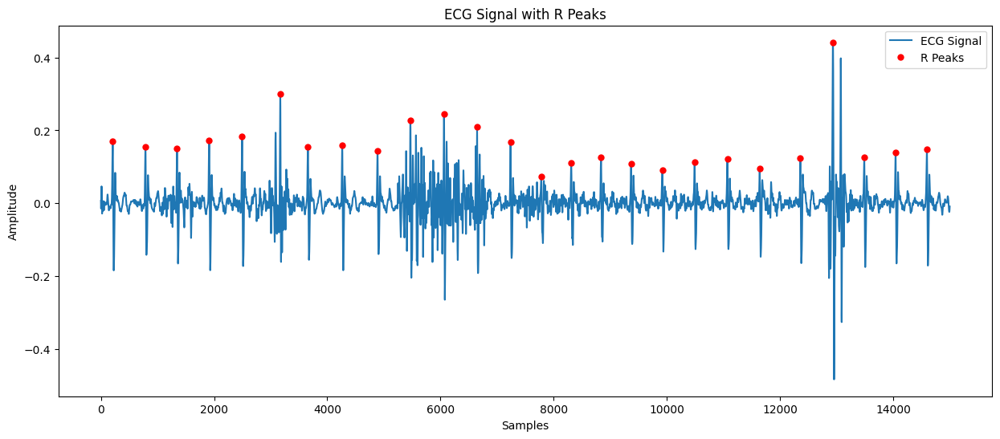

30000 45000


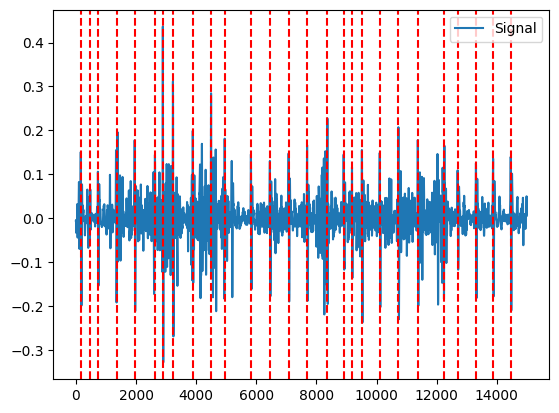

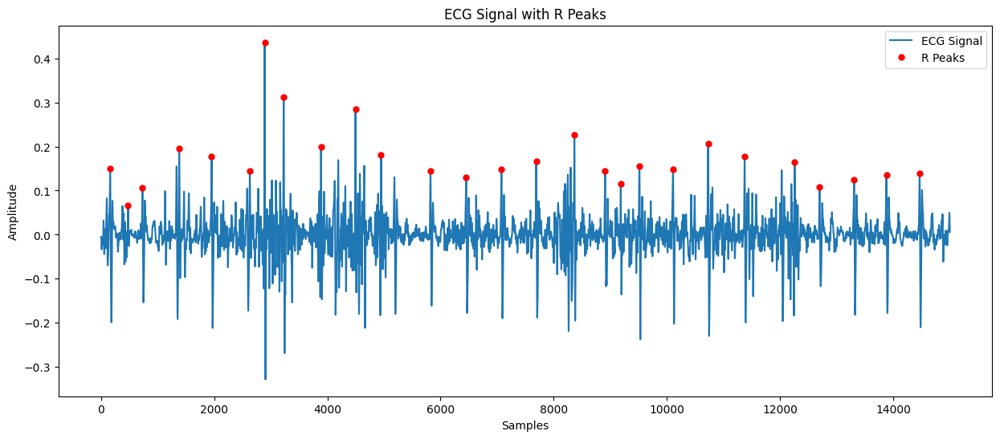

45000 60000


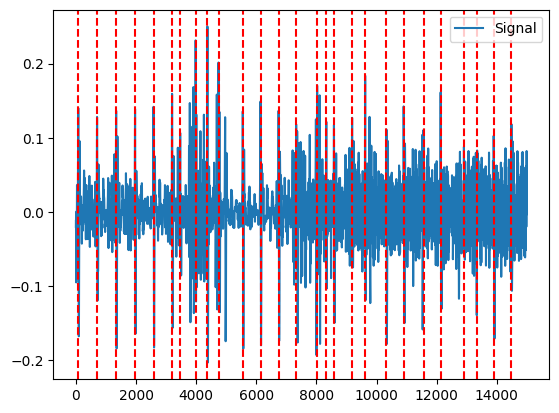

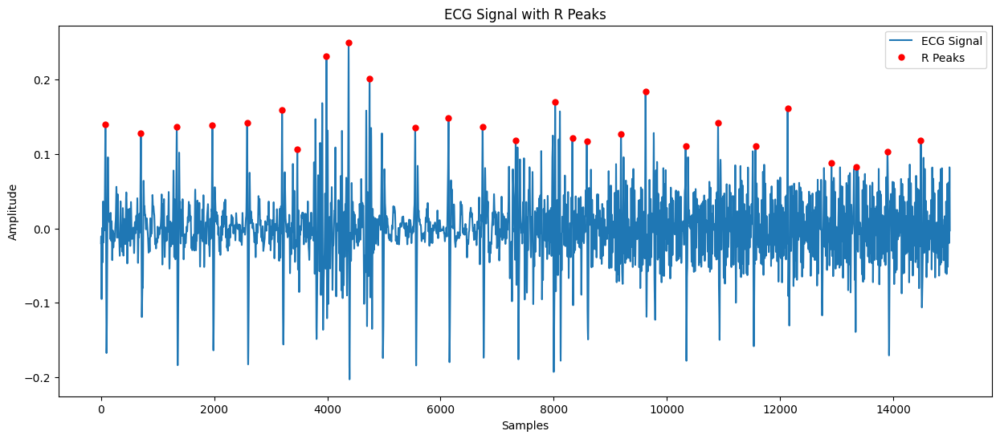

60000 75000


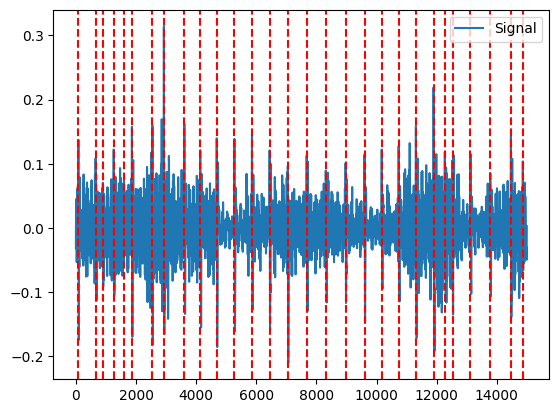

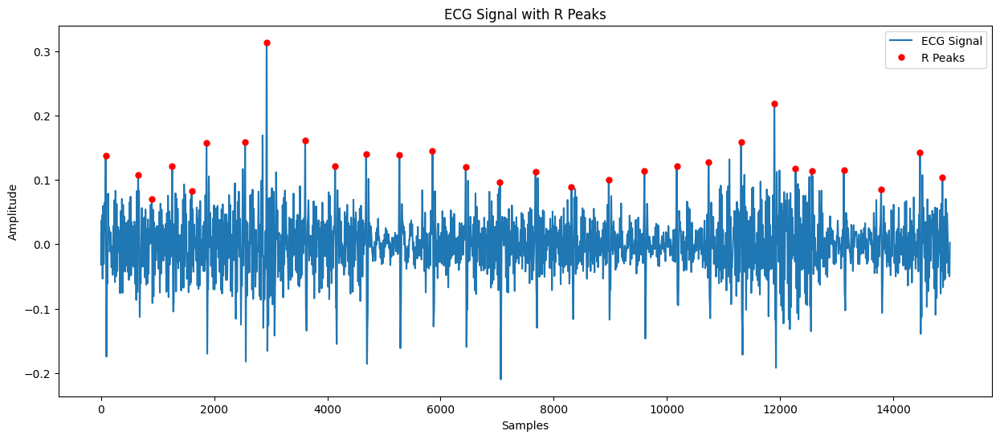

75000 90000


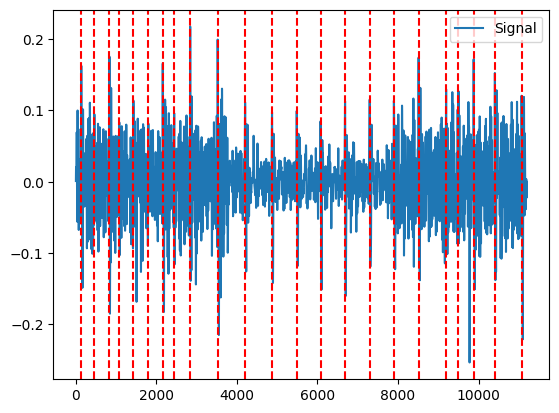

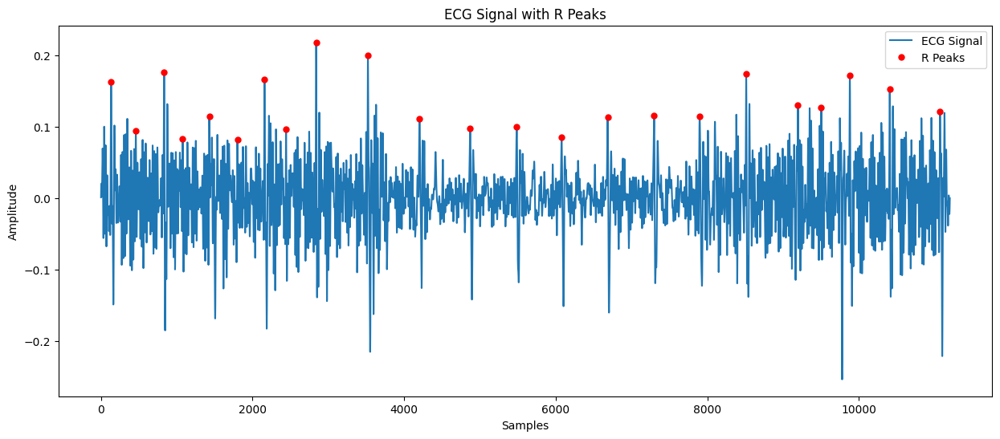

[{'ECG_R_Peaks': array([   20,   567,  1153,  1750,  2352,  2946,  3555,  4151,  4718,
        5282,  5865,  6451,  7032,  7625,  8198,  8752,  9310,  9872,
       10449, 11021, 11619, 12228, 12827, 13435, 14027, 14614])}, {'ECG_R_Peaks': array([15209, 15787, 16344, 16913, 17494, 18170, 18658, 19264, 19887,
       20469, 21063, 21647, 22238, 22781, 23310, 23837, 24368, 24920,
       25490, 26069, 26640, 27358, 27935, 28488, 29041, 29595])}, {'ECG_R_Peaks': array([30162, 30478, 30732, 31383, 31955, 32629, 32892, 33228, 33888,
       34496, 34949, 35822, 36453, 37076, 37690, 38365, 38907, 39184,
       39513, 40107, 40728, 41373, 42257, 42697, 43307, 43878, 44464])}, {'ECG_R_Peaks': array([45079, 45704, 46339, 46968, 47582, 48199, 48469, 48983, 49375,
       49745, 50551, 51141, 51743, 52327, 53025, 53329, 53584, 54188,
       54622, 55330, 55903, 56564, 57133, 57907, 58346, 58897, 59487])}, {'ECG_R_Peaks': array([60083, 60655, 60897, 61258, 61601, 61864, 62546, 62927, 63607,
       6413

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
chunk_size=15000
sampling=800
read_file2=pd.read_csv('/content/209_ECG.csv')
num_chunks = len(read_file2) // chunk_size
print(len(read_file2))
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,1].values
  print(start_row, end_row)
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='engzeemod2012')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks1 = pd.DataFrame()
combined_rpeaks1 = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks1)

In [ ]:
hrv_results1 = nk.hrv(combined_rpeaks1, sampling_rate=800, scale=(4, 16))
csv_file = 'combined.csv'
if os.path.exists(csv_file):
    existing_data = pd.read_csv(csv_file)
    updated_data = pd.concat([existing_data, hrv_results1], ignore_index=True)
    updated_data.to_csv(csv_file, index=False)
else:
    hrv_results1.to_csv(csv_file, index=False)

print(hrv_results1)

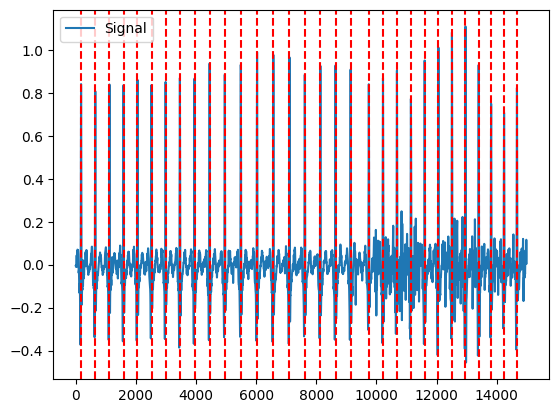

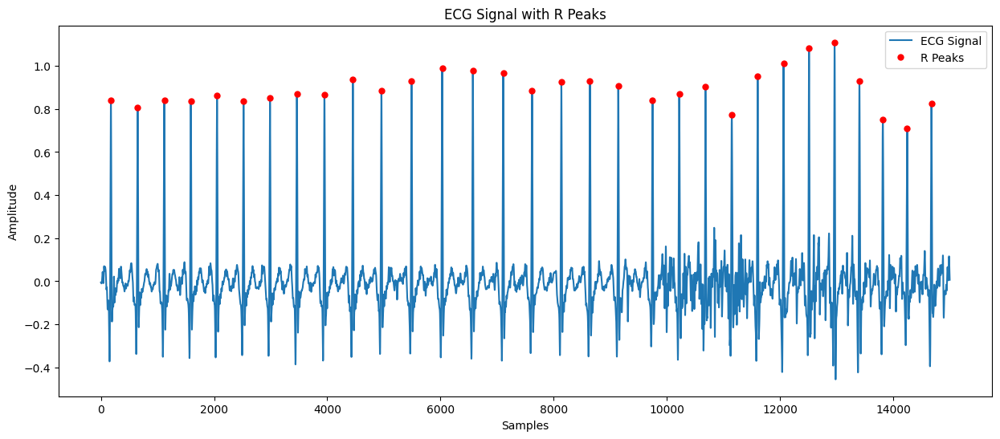

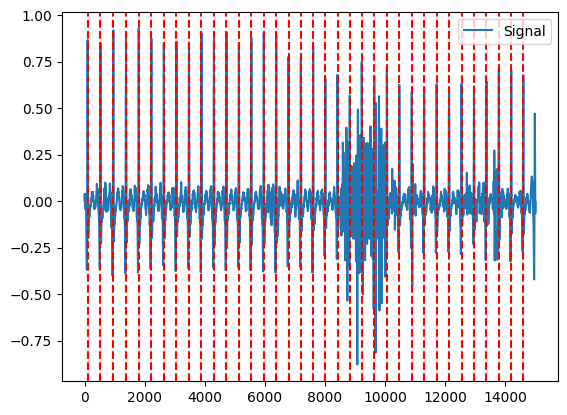

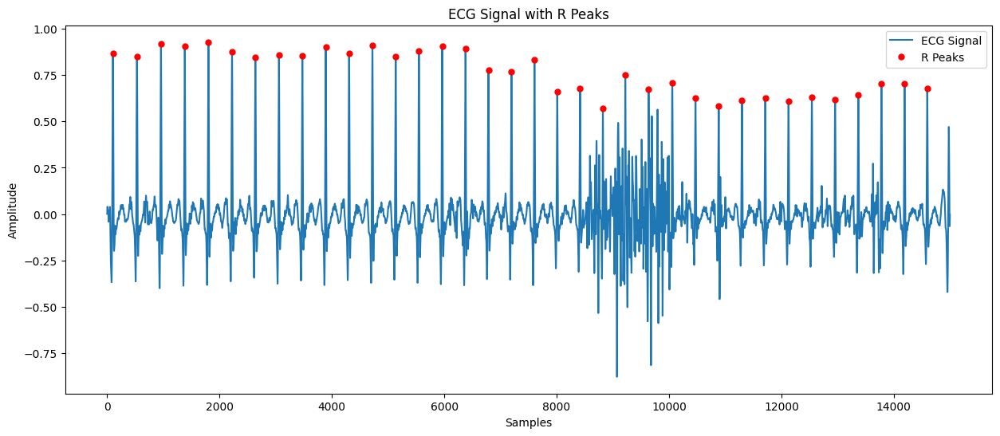

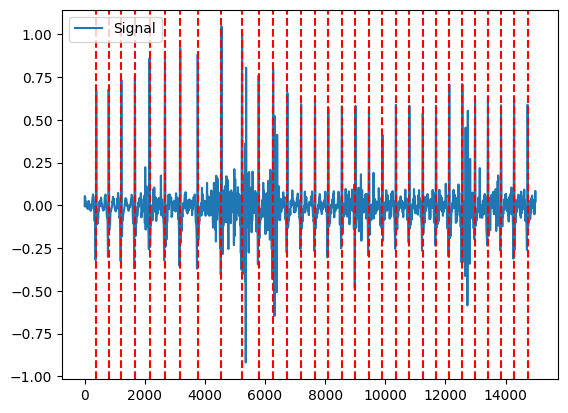

...

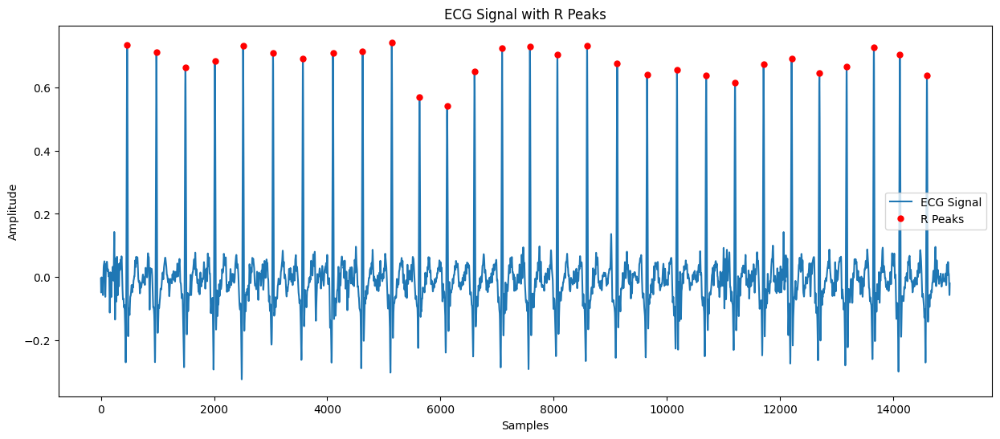

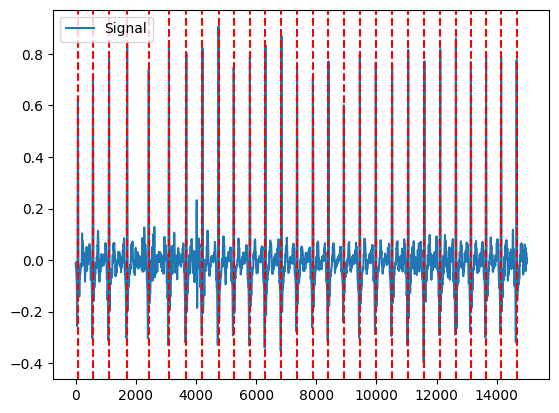

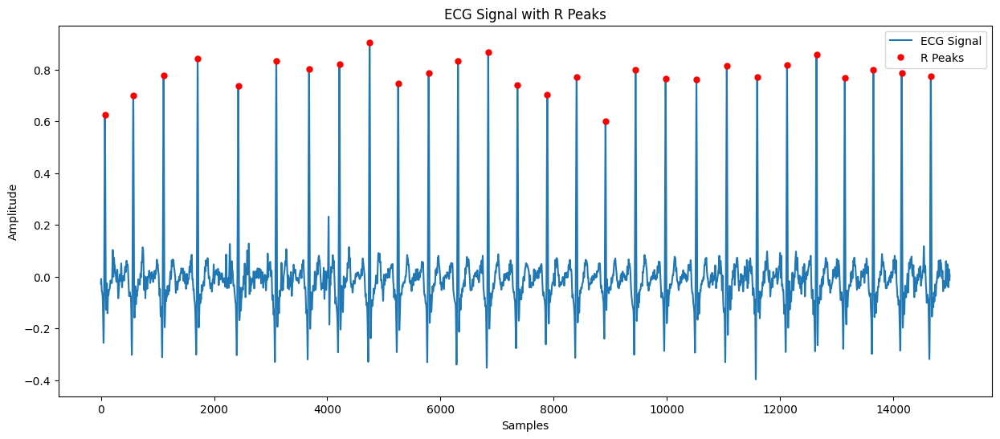

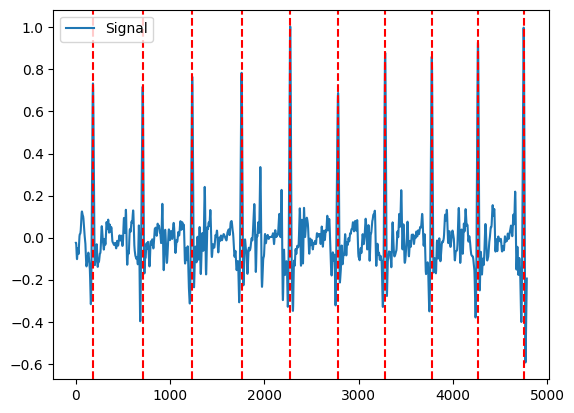

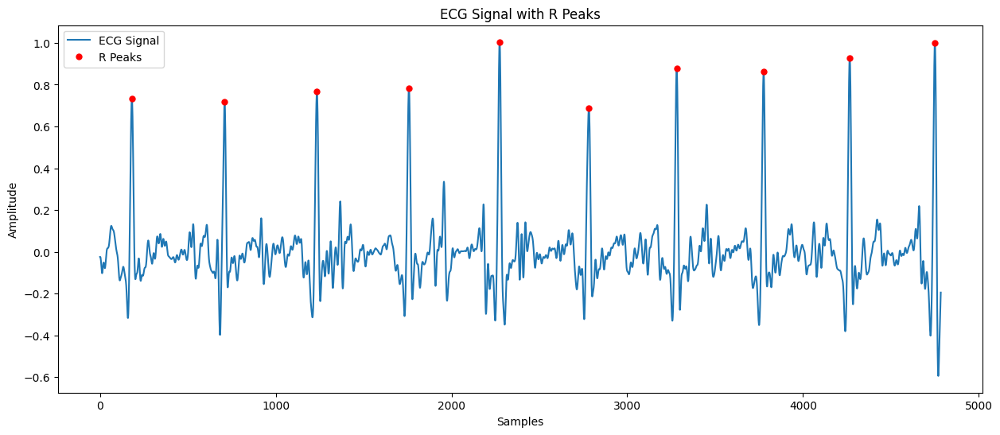

[{'ECG_R_Peaks': array([  176,   649,  1120,  1589,  2052,  2520,  2988,  3463,  3950,
        4452,  4957,  5489,  6031,  6572,  7109,  7618,  8136,  8641,
        9142,  9748, 10219, 10683, 11148, 11605, 12063, 12513, 12964,
       13402, 13817, 14247, 14675])}, {'ECG_R_Peaks': array([15102, 15530, 15957, 16381, 16803, 17223, 17638, 18057, 18474,
       18891, 19306, 19721, 20135, 20549, 20963, 21377, 21786, 22196,
       22605, 23010, 23416, 23822, 24222, 24637, 25058, 25471, 25885,
       26298, 26712, 27126, 27542, 27956, 28369, 28781, 29193, 29595])}, {'ECG_R_Peaks': array([30386, 30799, 31221, 31671, 32159, 32672, 33180, 33761, 34551,
       35237, 35788, 36270, 36744, 37201, 37662, 38104, 38557, 39009,
       39458, 39907, 40354, 40801, 41247, 41688, 42129, 42564, 42987,
       43415, 43850, 44285, 44734])}, {'ECG_R_Peaks': array([45189, 45660, 46138, 46630, 47128, 47632, 48120, 48614, 49092,
       49574, 50056, 50537, 51000, 51478, 51950, 52418, 52863, 53329,
       53792, 54

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
sampling=800
chunk_size=15000
read_file2=pd.read_csv('/content/211_ECG.csv')
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,1].values
  print(start_row, end_row)
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='engzeemod2012')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks = pd.DataFrame()
combined_rpeaks = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks)

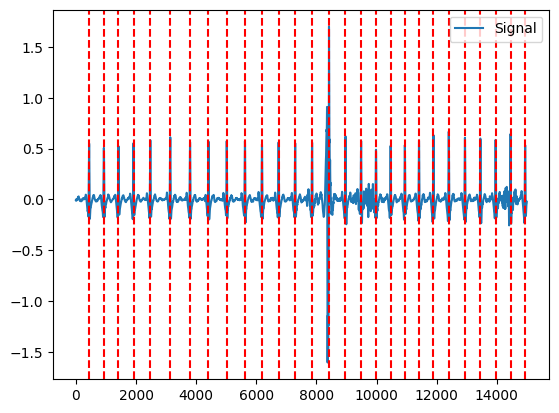

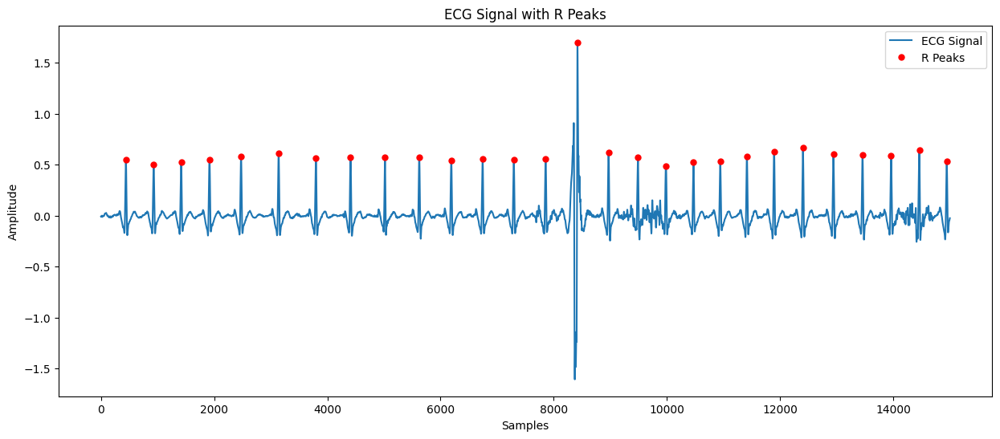

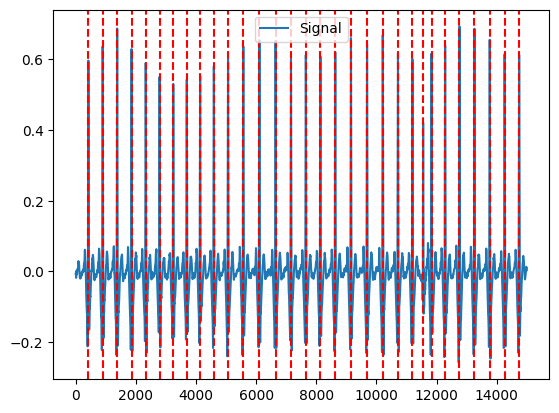

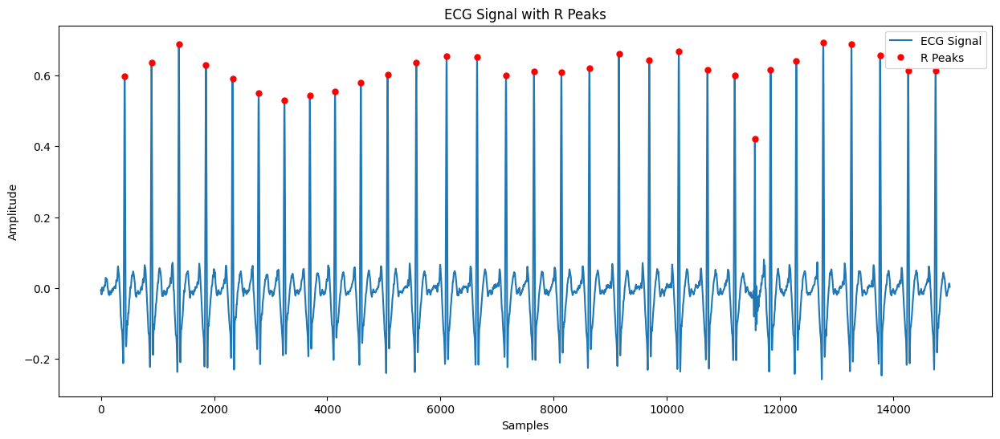

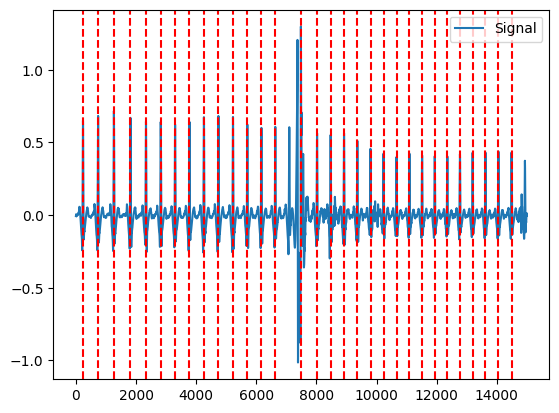

...

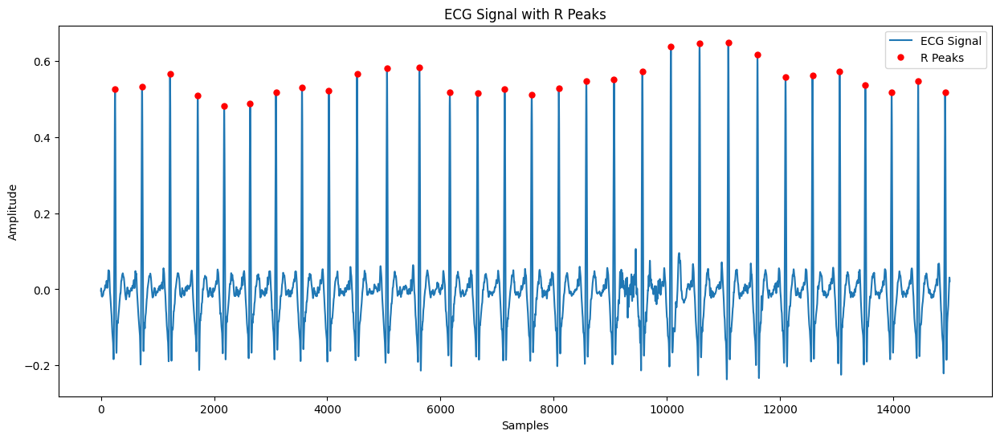

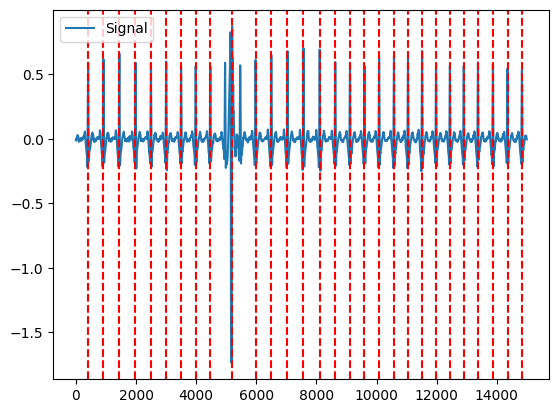

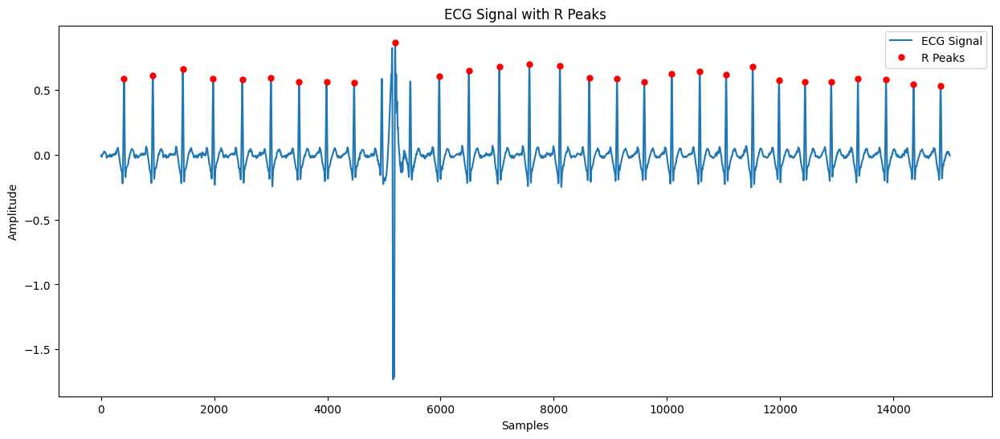

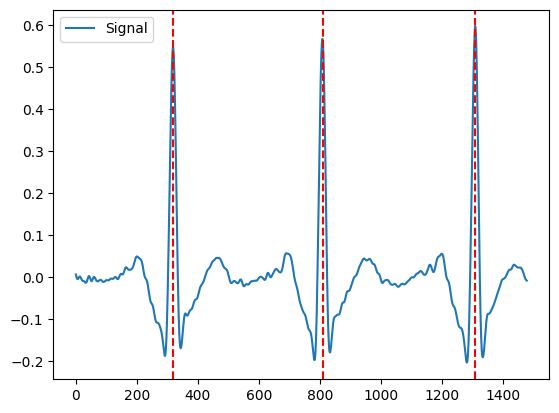

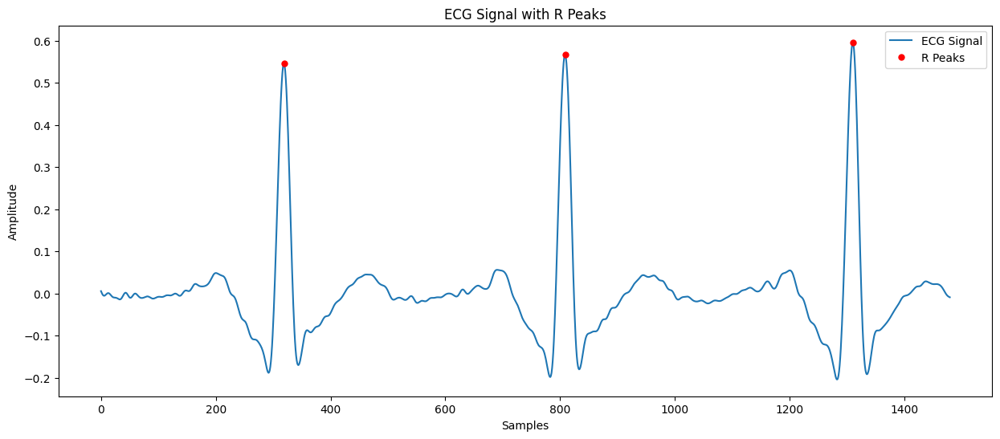

[{'ECG_R_Peaks': array([  440,   930,  1417,  1917,  2475,  3139,  3798,  4410,  5017,
        5623,  6189,  6743,  7294,  7857,  8419,  8968,  9488,  9982,
       10468, 10942, 11413, 11894, 12403, 12941, 13456, 13961, 14459,
       14944])}, {'ECG_R_Peaks': array([15420, 15894, 16377, 16856, 17326, 17787, 18243, 18692, 19137,
       19593, 20066, 20573, 21108, 21646, 22158, 22652, 23137, 23632,
       24153, 24689, 25211, 25717, 26199, 26555, 26834, 27287, 27764,
       28262, 28769, 29265, 29749])}, {'ECG_R_Peaks': array([30236, 30739, 31264, 31816, 32331, 32822, 33300, 33778, 34258,
       34741, 35225, 35702, 36171, 36633, 37484, 38022, 38474, 38920,
       39361, 39800, 40233, 40665, 41094, 41517, 41937, 42355, 42776,
       43197, 43622, 44054, 44492])}, {'ECG_R_Peaks': array([45383, 45828, 46285, 46738, 47191, 47645, 48088, 48526, 48959,
       49393, 49828, 50280, 50727, 51217, 51735, 52246, 52726, 53191,
       53646, 54097, 54548, 55004, 55466, 55940, 56429, 56921, 57421,
  

In [ ]:
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
sampling=800
chunk_size=15000
read_file2=pd.read_csv('/content/your_local_directory/217_ECG.csv')
num_chunks = len(read_file2) // chunk_size
all_rpeaks = []
for i in range(num_chunks+1):
  start_row=i*chunk_size
  end_row=(i+1)*chunk_size
  ecg_signal2=read_file2.iloc[start_row:end_row,1].values
  ecg_cleaned2=nk.ecg_clean(ecg_signal2, sampling_rate=sampling, method='engzeemod2012')
  lowcut = 4.0
  highcut = 50.0
  fs = sampling
  def band_pass_filter(ecg_cleaned2, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='band')
    y = signal.filtfilt(b, a, ecg_cleaned2)
    return y
  ecg_filtered = band_pass_filter(ecg_cleaned2, lowcut, highcut, fs)
  _, emrich2023 = nk.ecg_peaks(ecg_filtered, sampling_rate=sampling, method="emrich2023")
  adjusted_rpeaks = {key: value + start_row for key, value in emrich2023.items() if key == "ECG_R_Peaks"}
  all_rpeaks.append(adjusted_rpeaks)
  plot = nk.events_plot(emrich2023['ECG_R_Peaks'], ecg_filtered)
  plt.figure(figsize=(15, 6))
  plt.plot(ecg_filtered, label='ECG Signal')

  r_peaks = emrich2023['ECG_R_Peaks']
  plt.plot(r_peaks, ecg_filtered[r_peaks], 'ro', markersize=5, label='R Peaks')

  plt.title('ECG Signal with R Peaks')
  plt.xlabel('Samples')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.show()
print(all_rpeaks)
combined_rpeaks = pd.DataFrame()
combined_rpeaks = np.concatenate([r["ECG_R_Peaks"] for r in all_rpeaks if "ECG_R_Peaks" in r])
print(combined_rpeaks)